<!-- AUTHOR INFO -->
<p style="font-family:'Segoe UI', sans-serif; font-size:1.7em; margin-top:3em; color:#2b6cb0; text-align:right;">
  ✍️ <strong>Author:</strong> 
  <a href="https://www.kaggle.com/ganesh12345m" target="_blank" style="color:#3182ce; text-decoration:none;">
    Ganesh12345m
  </a>
</p>



<h1 style="font-size:2em; font-family:'Segoe UI', sans-serif; color:#2b6cb0;">🌿 Exploratory Data Analysis: Tree Crown Detection</h1>
<hr>

<!-- GOALS -->
<div style="background-color:#f0f8ff; border-left:6px solid #3182ce; padding:1.2em; margin-bottom:1em; font-family:'Segoe UI', sans-serif;">
  <h2 style="color:#2c5282;">🎯 <strong>Goals of This Notebook</strong></h2>
  <ul style="margin-left:1em;">
    <li>Examine the structure of the NEON tree crown dataset (v0.0.1).</li>
    <li>Visualize full RGB images along with their crown annotations.</li>
    <li>Break down annotation formats and decode XML metadata.</li>
    <li>Quantify class distribution and dataset composition (Train, Val, Test).</li>
    <li>Evaluate cropping strategies and full-tile availability.</li>
    <li>Validate data integrity through bounding box visualizations and statistical summaries.</li>
    <li>Ensure the dataset is ready for downstream modeling and segmentation tasks.</li>
  </ul>
</div>

<!-- CONTENTS -->
<div style="font-family:'Segoe UI', sans-serif;">
  <h2 style="color:#2b6cb0;">📂 Contents of This Notebook</h2>
  <ul style="margin-left:1em;">
    <li>🌿 <strong>Exploratory Data Analysis: Tree Crown Detection</strong></li>
    <li>🎯 <strong>Goals of This Notebook</strong></li>
    <li>📂 <strong>Contents of This Notebook</strong></li>
    <li>🌳 <strong>NEON Tree Crowns Original Dataset Overview (v0.0.1)</strong></li>
    <li>📦 <strong>Python Imports & Setup</strong></li>
    <li>📑 <strong>Decoding the Annotation Format</strong></li>
    <li>🧬 <strong>Class Distribution Overview</strong></li>
    <li>📂 <strong>What Do These Folder Names Mean?</strong></li>
    <li>📈 <strong>Analyzing & Visualizing RGB Data</strong></li>
    <li>🖼️ <strong>Visualization of RGB Data</strong></li>
    <li>📈 <strong>Analysis of Dataset Visualizations</strong></li>
    <li>📊 <strong>Summary of Train, Validation & Test Splits</strong></li>
    <li>🔍 <strong>Modality Coverage & Full-Tile Availability</strong></li>
    <li>🔁 <strong>Reverse Engineering Cropping Offsets</strong></li>
    <li>⚙️ <strong>Trial-and-Error Offset Calculation Method & Final Values</strong></li>
    <li>🖼️ <strong>Visualization of Bounding Boxes on Full Image Tiles</strong></li>
  </ul>
</div>



<!-- NEXT STEP -->
<p style="font-family:'Segoe UI', sans-serif; font-size:1.1em; margin-top:2em; color:#1a202c;">
  ➡️ <strong>Next Step:</strong> We’ll start by examining the dataset organization and inspecting a few RGB tiles and their annotations.
</p>





<div style="background-color:#f7fafc; border-left: 6px solid #2c5282; padding: 1em; font-family: 'Segoe UI', sans-serif;">

<h1 style="color:#2c5282;">🌳 NEON Tree Crowns Original Dataset Overview (v0.0.1)</h1>
<p><b>Reference:</b> <a href="https://doi.org/10.5281/zenodo.3765872" target="_blank">Weinstein et al., April 2020</a></p>

<hr style="border-top: 1px solid #cbd5e0;">

<h3 style="color:#2f855a;">📊 What Is This Dataset?</h3>
<p>This dataset provides <b>bounding-box delineations</b> for over <b>100 million tree crowns</b> across <b>37 terrestrial sites</b> in the U.S., via the <b>NEON project</b>.</p>

<ul>
  <li><b>RGB Imagery:</b> 0.5–1m resolution</li>
  <li><b>LiDAR Point Clouds:</b> Used for crown height estimation</li>
</ul>

<hr style="border-top: 1px solid #cbd5e0;">

<h3 style="color:#d69e2e;">🎯 Key Features</h3>

<ul>
  <li style="color:#e53e3e;"><b>Scale & Diversity:</b> Wide range of ecosystems – from Oregon’s forests to Florida wetlands</li>
  <li style="color:#2b6cb0;"><b>High Accuracy:</b> Deep learning + LiDAR filtering for precise crown segmentation</li>
  <li style="color:#38a169;"><b>Open Science:</b> CC-BY license for full reproducibility & sharing</li>
</ul>

<hr style="border-top: 1px solid #cbd5e0;">

<h3 style="color:#805ad5;">📁 Dataset Structure</h3>

<pre style="background-color:#edf2f7; padding:1em; border-radius:8px;">
├── crown_boxes.shp        # Shapefile: bounding boxes of crowns
├── crown_metrics.csv      # Metadata: area, height per crown
├── rgb_tiles/             # RGB GeoTIFF imagery
└── lidar_tiles/           # LiDAR point clouds (LAS/LAZ)
</pre>

<p><b>📌 Tips:</b></p>
<ul>
  <li><code>crown_boxes.shp</code> → Load with <code>geopandas</code></li>
  <li><code>crown_metrics.csv</code> → Use for EDA: <i>area vs height</i>, filtering, grouping by site</li>
</ul>

<hr style="border-top: 1px solid #cbd5e0;">

<h4 style="color:#2c5282;">🚀 What’s Next?</h4>
<p>We’ll parse these files to count tree crowns, analyze height/area distributions, and visualize samples—getting ready for deep learning model training!</p>

</div>


<div style="background-color:#fefcbf; border-left: 6px solid #d69e2e; padding: 1em; font-family: 'Segoe UI', sans-serif;">

<h1 style="color:#b7791f;">📦 Python Imports & Setup</h1>

<p>These are the core libraries and modules used for:</p>
<ul>
  <li><strong>Data handling</strong>: <code>os</code>, <code>random</code>, <code>warnings</code>, <code>tqdm</code></li>
  <li><strong>Image processing</strong>: <code>PIL</code>, <code>xml.etree.ElementTree</code></li>
  <li><strong>PyTorch & TorchVision</strong>: For model loading and training</li>
  <li><strong>Display Utilities</strong>: <code>IPython.display</code> for rich notebook outputs</li>
</ul>

<pre style="background-color:#fffaf0; padding:1em; border-radius:8px;"><code style="color:#2d3748;">import os
from IPython.display import display, HTML
from PIL import Image
import warnings
import pandas as pd
import numpy as np
warnings.filterwarnings("ignore")

import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import ToTensor

import xml.etree.ElementTree as ET
from tqdm import tqdm
import random</code></pre>

<p>✅ <strong>Note:</strong> Suppressed warnings for cleaner logs during development.</p>

</div>


In [ ]:
pip install rasterio matplotlib

In [1]:
import os
from IPython.display import display, HTML
from PIL import Image
import warnings
warnings.filterwarnings("ignore")
import os
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import ToTensor
from PIL import Image
import xml.etree.ElementTree as ET
from tqdm import tqdm
import random
from IPython.display import display
import matplotlib.pyplot as plt

In [6]:
import os

def explore_dir(path, max_items=5, indent=0):
    """
    Recursively print directory structure.
    
    Args:
        path (str): Directory path to explore.
        max_items (int): Max children to list per folder.
        indent (int): Current indent level (internal use).
    """
    prefix = "  " * indent
    # List entries sorted
    try:
        entries = sorted(os.listdir(path))
    except PermissionError:
        print(f"{prefix}📁 {os.path.basename(path)}/  [Permission Denied]")
        return
    
    # Count .tif files in this folder
    tif_files = [e for e in entries if e.lower().endswith('.tif')]
    if indent == 0:
        # Top‐level: print base folder name
        print(f"{prefix}📁 {os.path.basename(path)}/ ({len(tif_files)} .tif files)")
    else:
        print(f"{prefix}📁 {os.path.basename(path)}/ ({len(tif_files)} .tif files)")
    
    # Show first max_items children
    for child in entries[:max_items]:
        child_path = os.path.join(path, child)
        if os.path.isdir(child_path):
            print(f"{prefix}  └── 📁 {child}/")
        else:
            print(f"{prefix}  └── 📄 {child}")
    
    if len(entries) > max_items:
        print(f"{prefix}  ... ({len(entries) - max_items} more items)")
    
    # Recurse into each subfolder
    for child in entries:
        child_path = os.path.join(path, child)
        if os.path.isdir(child_path):
            explore_dir(child_path, max_items, indent+1)

# Usage
base_path = "/kaggle/input/tree-crown-dataset"
explore_dir(base_path, max_items=8)


📁 tree-crown-dataset/ (0 .tif files)
  └── 📁 neon-dataset/
  📁 neon-dataset/ (0 .tif files)
    └── 📁 annotations/
    └── 📁 evaluation/
    └── 📁 test/
    └── 📁 train/
    └── 📁 training/
    └── 📁 val/
    📁 annotations/ (0 .tif files)
      └── 📄 10.xml
      └── 📄 12.xml
      └── 📄 15.xml
      └── 📄 2018_BART_4_322000_4882000_image_crop.xml
      └── 📄 2018_HARV_5_733000_4698000_image_crop.xml
      └── 📄 2018_JERC_4_742000_3451000_image_crop.xml
      └── 📄 2018_MLBS_3_541000_4140000_image_crop.xml
      └── 📄 2018_MLBS_3_541000_4140000_image_crop2.xml
      ... (1955 more items)
    📁 evaluation/ (0 .tif files)
      └── 📁 CHM/
      └── 📁 Hyperspectral/
      └── 📁 LiDAR/
      └── 📁 RGB/
      📁 CHM/ (2178 .tif files)
        └── 📄 2018_SJER_3_252000_4104000_image_628_CHM.tif
        └── 📄 2018_SJER_3_252000_4106000_image_234_CHM.tif
        └── 📄 2018_SJER_3_252000_4106000_image_326_CHM.tif
        └── 📄 2018_SJER_3_252000_4106000_image_66_CHM.tif
        └── 📄 2018_SJER_3_

In [7]:
import os

def explore_dir(path, max_subdirs=5, indent=0):
    """
    Recursively print directory structure, reporting:
      - subfolders (limited to max_subdirs listed)
      - counts of .tif and .xml files
      - full names of any .csv files
    """
    prefix = "  " * indent
    name = os.path.basename(path) or path
    try:
        entries = sorted(os.listdir(path))
    except PermissionError:
        print(f"{prefix}📁 {name}/  [Permission Denied]")
        return
    
    # Separate entries by type
    subdirs    = [e for e in entries if os.path.isdir(os.path.join(path, e))]
    tif_files  = [e for e in entries if e.lower().endswith('.tif')]
    xml_files  = [e for e in entries if e.lower().endswith('.xml')]
    csv_files  = [e for e in entries if e.lower().endswith('.csv')]
    
    # Print folder header with counts
    print(f"{prefix}📁 {name}/")
    
    # List subdirectories
    for sub in subdirs[:max_subdirs]:
        print(f"{prefix}  └── 📁 {sub}/")
    if len(subdirs) > max_subdirs:
        print(f"{prefix}  ... ({len(subdirs) - max_subdirs} more subfolders)")
    
    # Report .tif and .xml counts
    if tif_files:
        print(f"{prefix}  └── 🖼️  {len(tif_files)} .tif files")
    if xml_files:
        print(f"{prefix}  └── 📄  {len(xml_files)} .xml files")
    
    # List all .csv files by name
    for csv in csv_files:
        print(f"{prefix}  └── 📑  {csv}")
    
    # Recurse into subdirectories
    for sub in subdirs:
        explore_dir(os.path.join(path, sub), max_subdirs, indent+1)

# Usage
base_path = "/kaggle/input/tree-crown-dataset"
explore_dir(base_path, max_subdirs=8)


📁 tree-crown-dataset/
  └── 📁 neon-dataset/
  📁 neon-dataset/
    └── 📁 annotations/
    └── 📁 evaluation/
    └── 📁 test/
    └── 📁 train/
    └── 📁 training/
    └── 📁 val/
    📁 annotations/
      └── 📄  1956 .xml files
      └── 📑  2019_DSNY_5_452000_3113000_image_crop.csv
      └── 📑  benchmark_annotations.csv
    📁 evaluation/
      └── 📁 CHM/
      └── 📁 Hyperspectral/
      └── 📁 LiDAR/
      └── 📁 RGB/
      📁 CHM/
        └── 🖼️  2178 .tif files
        └── 📄  6 .xml files
      📁 Hyperspectral/
        └── 🖼️  2157 .tif files
      📁 LiDAR/
      📁 RGB/
        └── 🖼️  2289 .tif files
        └── 📄  197 .xml files
        └── 📑  benchmark_annotations.csv
        └── 📑  classes.csv
        └── 📑  test.csv
    📁 test/
      └── 🖼️  194 .tif files
      └── 📑  test.csv
    📁 train/
      └── 🖼️  53100 .tif files
      └── 📑  train.csv
    📁 training/
      └── 📁 CHM/
      └── 📁 Hyperspectral/
      └── 📁 LiDAR/
      └── 📁 RGB/
      📁 CHM/
        └── 🖼️  16 .tif files
      

<div style="background-color:#fefcbf; border-left:6px solid #d69e2e; padding: 1.2em; font-family:'Segoe UI', sans-serif;">

<h1 style="color:#2b6cb0;">📑 Decoding the Annotation Format</h1>

<p>
The NEON Tree Crowns annotations follow an XML layout akin to Pascal VOC. Each file captures image metadata and one or more tree object definitions.
</p>

---

<h3 style="color:#2c5282;">📄 Key Elements in Each Annotation File:</h3>

<ul style="line-height: 1.6;">
  <li><code>&lt;filename&gt;</code>: Name of the image file</li>
  <li><code>&lt;size&gt;</code>: Width, height, and depth of the image</li>
  <li><code>&lt;object&gt;</code>: Repeated tag containing bounding box info for each tree</li>
  <ul>
    <li><code>&lt;name&gt;</code>: Label for the object (e.g., "Tree")</li>
    <li><code>&lt;bndbox&gt;</code>: Coordinates for the bounding box:
      <ul>
        <li><code>&lt;xmin&gt;</code>, <code>&lt;ymin&gt;</code>: Top-left corner</li>
        <li><code>&lt;xmax&gt;</code>, <code>&lt;ymax&gt;</code>: Bottom-right corner</li>
      </ul>
    </li>
  </ul>
</ul>

<h3 style="color:#2b6cb0;">📂 Sample Annotation Structure</h3>

<pre style="background-color:#f0f5ff; border:1px solid #cbd5e0; padding:1em; border-radius:6px; font-size:0.95em;"><code style="color:#2d3748;">
<annotation>
  <folder>images</folder>
  <filename>image_00123.tif</filename>
  <size>
    <width>400</width>
    <height>400</height>
    <depth>3</depth>
  </size>
  <object>
    <name>Tree</name>
    <bndbox>
      <xmin>35</xmin>
      <ymin>78</ymin>
      <xmax>172</xmax>
      <ymax>214</ymax>
    </bndbox>
  </object>
</annotation>
</code></pre>

---

<h3 style="color:#2b6cb0;">🧬 Label Extraction Logic</h3>

<pre style="background-color:#eef6ff; border:1px solid #cbd5e0; padding:1em; border-radius:6px;"><code style="color:#2d3748;">
text = None
tree_node = obj.find("tree")
if tree_node is not None and tree_node.text and tree_node.text.strip():
    text = tree_node.text.strip()
else:
    name_node = obj.find("name")
    if name_node is not None and name_node.text and name_node.text.strip():
        text = name_node.text.strip()
</code></pre>

<p>This ensures we first attempt to read the `<tree>` tag, falling back to `<name>` if needed.</p>

---

<h3 style="color:#2b6cb0;">📊 Annotation Fields & Types</h3>

<table style="background-color:#f0faff; padding:1em; border-radius:8px;">
  <thead>
    <tr>
      <th align="left">Field Path</th>
      <th align="left">Initial Data Type</th>
    </tr>
  </thead>
  <tbody>
    <tr><td>annotation/filename</td><td>object</td></tr>
    <tr><td>annotation/folder</td><td>object</td></tr>
    <tr><td>annotation/size/width</td><td>object</td></tr>
    <tr><td>annotation/size/height</td><td>object</td></tr>
    <tr><td>annotation/size/depth</td><td>object</td></tr>
    <tr><td>annotation/object/bndbox/xmin</td><td>object</td></tr>
    <tr><td>annotation/object/bndbox/ymin</td><td>object</td></tr>
    <tr><td>annotation/object/bndbox/xmax</td><td>object</td></tr>
    <tr><td>annotation/object/bndbox/ymax</td><td>object</td></tr>
    <tr><td>annotation/object/name</td><td>object</td></tr>
    <tr><td>annotation/object/difficult</td><td>object</td></tr>
    <tr><td>annotation/object/occluded</td><td>object</td></tr>
    <tr><td>annotation/object/pose</td><td>object</td></tr>
    <tr><td>annotation/object/truncated</td><td>object</td></tr>
    <tr><td>annotation/segmented</td><td>object</td></tr>
  </tbody>
</table>

---

<h3 style="color:#2b6cb0;">📌 Key Notes</h3>

<ul>
  <li>Coordinates (`xmin`, `ymin`, `xmax`, `ymax`) are strings — convert to <code>int</code> or <code>float</code> before modeling.</li>
  <li>Images may contain <strong>multiple `<object>`</strong> entries.</li>
  <li>Missing tags are gracefully handled via the fallback extraction logic.</li>
</ul>

</div>


In [9]:
import xml.etree.ElementTree as ET
import pandas as pd

# Load XML file
xml_path = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations/2018_BART_4_322000_4882000_image_crop.xml"
tree = ET.parse(xml_path)
root = tree.getroot()

# Function to recursively extract element paths and values
def parse_element(elem, parent_path=""):
    path = f"{parent_path}/{elem.tag}" if parent_path else elem.tag
    rows = []
    
    # If element has children, recurse
    if list(elem):
        for child in elem:
            rows.extend(parse_element(child, path))
    else:
        rows.append((path, elem.text))
    return rows

# Collect all leaf nodes
all_data = parse_element(root)

# Convert to DataFrame
df = pd.DataFrame(all_data, columns=["field", "value"])

# Optional: pivot if you want keys as columns (if not too nested)
flat_df = df.pivot_table(index=None, columns="field", values="value", aggfunc="first").reset_index(drop=True)

# Show full data
# Assuming `flat_df` is already created from previous step
print("Column Data Types:\n")
print(flat_df.dtypes)


Column Data Types:

field
annotation/filename              object
annotation/folder                object
annotation/object/bndbox/xmax    object
annotation/object/bndbox/xmin    object
annotation/object/bndbox/ymax    object
annotation/object/bndbox/ymin    object
annotation/object/difficult      object
annotation/object/name           object
annotation/object/occluded       object
annotation/object/pose           object
annotation/object/truncated      object
annotation/segmented             object
annotation/size/depth            object
annotation/size/height           object
annotation/size/width            object
dtype: object


In [12]:
import glob
import xml.etree.ElementTree as ET
import pandas as pd

# 1. Grab all your XMLs (or point to just one)
xml_paths = glob.glob("/kaggle/input/tree-crown-dataset/neon-dataset/annotations/*.xml")

rows = []
for path in xml_paths:
    tree = ET.parse(path)
    root = tree.getroot()
    
    # If you have multiple <object> entries per file, loop over them:
    for obj in root.findall("object"):
        xmin = int(obj.findtext("bndbox/xmin"))
        xmax = int(obj.findtext("bndbox/xmax"))
        ymin = int(obj.findtext("bndbox/ymin"))
        ymax = int(obj.findtext("bndbox/ymax"))
        name = obj.findtext("name")
        
        size = root.find("size")
        width  = int(size.findtext("width"))
        height = int(size.findtext("height"))
        depth  = int(size.findtext("depth"))
        
        rows.append({
            "filename": root.findtext("filename"),
            "xmin": xmin,
            "xmax": xmax,
            "ymin": ymin,
            "ymax": ymax,
            "class": name,
            "width": width,
            "height": height,
            "depth": depth
        })

# 2. Build DataFrame
df = pd.DataFrame(rows)

# 3. Show it!
print(df.head())   # for large sets, first 5 rows
# or simply: display(df) in a notebook


       filename  xmin  xmax  ymin  ymax class  width  height  depth
0  B05_0172.tif    56   182    19   156  None   1500    1500      3
1  B05_0172.tif   162   370     2   198  None   1500    1500      3
2  B05_0172.tif    98   271   193   340  None   1500    1500      3
3  B05_0172.tif   119   203   357   438  None   1500    1500      3
4  B05_0172.tif   198   344   321   501  None   1500    1500      3


In [13]:
# Display in a notebook with a bit of styling
from IPython.display import display

styled = (df.head()
            .style
            .set_caption("First 5 Annotations")
            .set_table_styles([{
                'selector': 'th',
                'props': [('background-color', '#f0f0f0'),
                          ('font-weight', 'bold')]
            }])
         )
display(styled)


,filename,xmin,xmax,ymin,ymax,class,width,height,depth
0,B05_0172.tif,56,182,19,156,None,1500,1500,3
1,B05_0172.tif,162,370,2,198,None,1500,1500,3
2,B05_0172.tif,98,271,193,340,None,1500,1500,3
3,B05_0172.tif,119,203,357,438,None,1500,1500,3
4,B05_0172.tif,198,344,321,501,None,1500,1500,3


In [23]:
import glob
import xml.etree.ElementTree as ET
import pandas as pd

# Define your mapping from class‐name to numeric label
LABEL_MAP = {
    "Tree": 1,
    "Other": 3,
    "Larch": 2,
    "Spruce": 4
    # add any other mappings here…
}

xml_paths = glob.glob("/kaggle/input/tree-crown-dataset/neon-dataset/annotations/*.xml")

rows = []
for path in xml_paths:
    tree = ET.parse(path)
    root = tree.getroot()
    filename = root.findtext("filename")
    
    for obj in root.findall("object"):
        # BBox coords
        xmin = int(obj.findtext("bndbox/xmin"))
        xmax = int(obj.findtext("bndbox/xmax"))
        ymin = int(obj.findtext("bndbox/ymin"))
        ymax = int(obj.findtext("bndbox/ymax"))
        
        # 1) Try <tree> first, then <name>, default to "Other"
        text = None
        tree_node = obj.find("tree")
        if tree_node is not None and tree_node.text and tree_node.text.strip():
            text = tree_node.text.strip()
        else:
            name_node = obj.find("name")
            if name_node is not None and name_node.text and name_node.text.strip():
                text = name_node.text.strip()
        
        # Normalize class name and map to label
        cls_name = text.title() if text else "Other"
        label_id = LABEL_MAP.get(cls_name, LABEL_MAP["Other"])
        
        # Image size info
        size = root.find("size")
        width  = int(size.findtext("width"))
        height = int(size.findtext("height"))
        depth  = int(size.findtext("depth"))
        
        rows.append({
            "filename": filename,
            "xmin": xmin,
            "ymin": ymin,
            "xmax": xmax,
            "ymax": ymax,
            "class": cls_name,   # e.g. “Tree”
            "label": label_id,   # e.g. 1
            "width": width,
            "height": height,
            "depth": depth
        })

# Build DataFrame
df = pd.DataFrame(rows)

# Quick sanity check
print("Classes found:", df["class"].unique())
print("Label distribution:\n", df["label"].value_counts())


Classes found: ['Larch' 'Other' 'Tree' 'Spruce']
Label distribution:
 label
2    77149
1    30975
3    24691
4        2
Name: count, dtype: int64


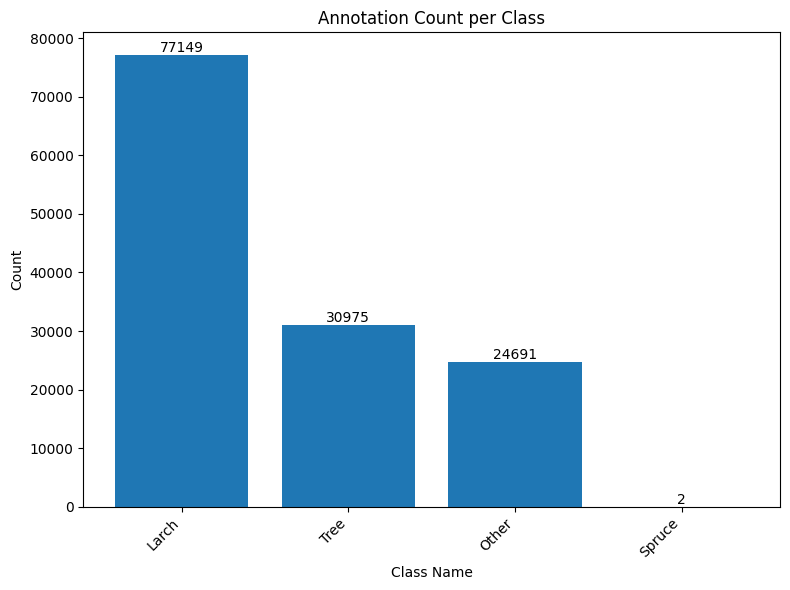

In [27]:
import matplotlib.pyplot as plt

# Counts per class name
class_counts = df["class"].value_counts()

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.bar(class_counts.index, class_counts.values)

# ─── Annotate counts on top of each bar ────────────────────────────────────
for bar in bars:
    h = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # x: center of the bar
        h + 3,                              # y: slightly above the bar
        f"{h}",                             # text: the count
        ha="center", va="bottom"
    )

# ─── Labels and layout ────────────────────────────────────────────────────
ax.set_xlabel("Class Name")
ax.set_ylabel("Count")
ax.set_title("Annotation Count per Class")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


<div style="background-color:#f0fff4; border-left:6px solid #38a169; padding: 1em; font-family:'Segoe UI', sans-serif;">

<h1 style="color:#2f855a;">🧬 Class Distribution Overview</h1>

<p><strong>Classes Found:</strong> <code>['Larch', 'Other', 'Tree', 'Spruce']</code></p>

<h3 style="color:#276749;">📊 Original Label Distribution</h3>

<table style="background-color:#e6fffa; padding:1em; border-radius:8px;">
  <thead>
    <tr>
      <th>Label</th>
      <th>Count</th>
    </tr>
  </thead>
  <tbody>
    <tr><td><strong>Tree</strong></td><td>77,149</td></tr>
    <tr><td><strong>Larch</strong></td><td>30,975</td></tr>
    <tr><td><strong>Other</strong></td><td>24,691</td></tr>
    <tr><td><strong>Spruce</strong></td><td>2</td></tr>
  </tbody>
</table>

<h3 style="color:#276749;">🎯 Rationale</h3>

<blockquote style="background-color:#fefcbf; padding:1em; border-left:5px solid #d69e2e;">
  <strong>Spruce</strong> appears only <strong>2 times</strong>—so few that it makes more sense to fold it into <strong>Other</strong><br>
  to avoid an extremely under-represented class.
</blockquote>

---

<h3 style="color:#276749;">🔢 Final Label Map</h3>

<table style="background-color:#f0f5ff; border-radius:8px;">
  <thead>
    <tr>
      <th>New Label ID</th>
      <th>Class Name</th>
    </tr>
  </thead>
  <tbody>
    <tr><td align="center">1</td><td>Tree</td></tr>
    <tr><td align="center">2</td><td>Larch</td></tr>
    <tr><td align="center">3</td><td>Other <em>(includes Spruce)</em></td></tr>
  </tbody>
</table>

<p style="font-size: 0.9em; color:#4a5568;">¹ “Original Count” for <code>Other</code> excludes Spruce; <strong>Adjusted Count</strong> = 24,691 + 2</p>

</div>


<div style="background-color:#f0f8ff; border-left:6px solid #3182ce; padding:1.2em; font-family:'Segoe UI', sans-serif;">

<h1 style="color:#2b6cb0;">📂 What Do These Folder Names Mean?</h1>

<ul style="line-height:1.6;">

  <li>
    <h3 style="color:#2c5282; margin-bottom:0.2em;">CHM/</h3>
    <p style="margin-top:0; padding-left:1em;">
      <strong>Canopy Height Model</strong> — a raster where each pixel encodes vegetation height above ground.  
      Computed by subtracting a digital terrain model (ground elevation) from a digital surface model (top-of-canopy).  
      <em>Useful for distinguishing tree crowns by vertical structure.</em>
    </p>
  </li>

  <li>
    <h3 style="color:#2c5282; margin-bottom:0.2em;">Hyperspectral/</h3>
    <p style="margin-top:0; padding-left:1em;">
      <strong>Hyperspectral Imagery</strong> — captures dozens to hundreds of narrow spectral bands (visible → short-wave IR).  
      Reveals subtle differences in leaf chemistry, moisture, and species composition.  
      <em>Great for advanced crown classification.</em>
    </p>
  </li>

  <li>
    <h3 style="color:#2c5282; margin-bottom:0.2em;">LiDAR/</h3>
    <p style="margin-top:0; padding-left:1em;">
      <strong>Light Detection and Ranging</strong> — laser pulses measure distances to produce a high-precision 3D point cloud.  
      Derivable canopy structure, branch architecture, and understory terrain.  
      <em>Augments or validates bounding boxes from imagery.</em>
    </p>
  </li>

  <li>
    <h3 style="color:#2c5282; margin-bottom:0.2em;">RGB/</h3>
    <p style="margin-top:0; padding-left:1em;">
      <strong>Red–Green–Blue Channels</strong> — standard 3-band optical imagery.  
      Widely available and forms the basis for our core Faster R-CNN tree crown detector.  
      <em>Less spectrally rich but essential for object detection.</em>
    </p>
  </li>

</ul>

</div>


<div style="background-color:#fffaf0; border-left:6px solid #dd6b20; padding:1.2em; font-family:'Segoe UI', sans-serif;">

<h1 style="color:#c05621;">📈 Analyzing & Visualizing RGB Data</h1>

<p>
We’ll use the images in <code>/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB</code> primarily for training our model to predict bounding boxes and class labels.
</p>

---

<h3 style="color:#c05621;">🔎 Key Steps</h3>

<ul style="line-height:1.6; padding-left:1em;">
  <li><strong>Sample Exploration</strong>: Display a few random images to verify quality, resolution, and visible tree crowns.</li>
  <li><strong>Resolution Check</strong>: Ensure all images share consistent dimensions (or resize/crop as needed).</li>
  
</ul>

---


<h3 style="color:#c05621;">📌 Important Points</h3>

<ul style="line-height:1.6; padding-left:1em;">
  <li>Images may vary slightly in brightness or contrast—<em>normalization</em> per-channel is recommended.</li>
  <li>Verify that filenames align with your annotation files (<code>.xml</code>) for correct bounding‐box mapping.</li>
  <li>Use consistent <strong>random seeds</strong> when sampling or augmenting to ensure reproducibility.</li>
  <li>Large images can be downscaled or tiled to fit GPU memory during training.</li>
</ul>

</div>


<h2 style="color:#2b6cb0; font-size:2em; font-family:'Segoe UI', sans-serif;">🖼️ Visualization RGB Images</h2>
<hr>

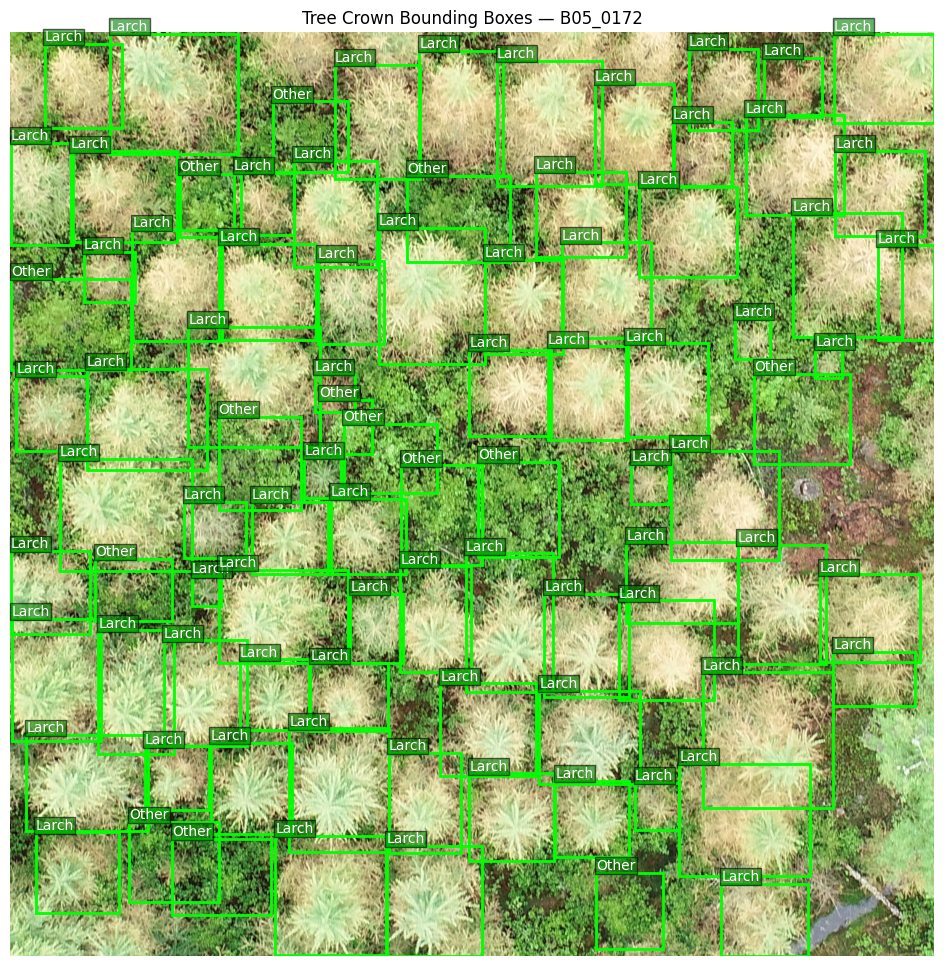

In [70]:


import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image

LABEL_MAP = {"Tree": 1, "Larch": 2, "Other": 3}  # background = 0

# Paths
xml_file   = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations/B05_0172.xml"
image_file = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/B05_0172.tif"

# 1. Parse XML
tree = ET.parse(xml_file)
root = tree.getroot()

# 2. Load the TIFF with PIL instead of tifffile
with Image.open(image_file) as img:
    image = np.array(img)

# 3. Plot
fig, ax = plt.subplots(1, figsize=(12, 12))
ax.imshow(image)

# 4. Overlay bounding boxes & labels
for obj in root.findall('object'):
    # pick <tree> then fallback to <name>
    text = None
    if obj.find("tree") is not None and obj.find("tree").text:
        text = obj.find("tree").text.strip()
    elif obj.find("name") is not None and obj.find("name").text:
        text = obj.find("name").text.strip()
    cls_name = text.title() if text else "Other"
    
    # map to numeric if needed
    label_id = LABEL_MAP.get(cls_name, LABEL_MAP["Other"])
    
    # bbox coords
    bb = obj.find('bndbox')
    xmin, ymin = int(bb.find('xmin').text), int(bb.find('ymin').text)
    xmax, ymax = int(bb.find('xmax').text), int(bb.find('ymax').text)

    # draw rectangle & text
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin,
                             linewidth=2, edgecolor='lime', facecolor='none')
    ax.add_patch(rect)
    ax.text(xmin, ymin-5, cls_name, fontsize=10, color='white',
            bbox=dict(facecolor='green', alpha=0.6, pad=1))

plt.axis('off')
plt.title("Tree Crown Bounding Boxes — B05_0172")
plt.show()


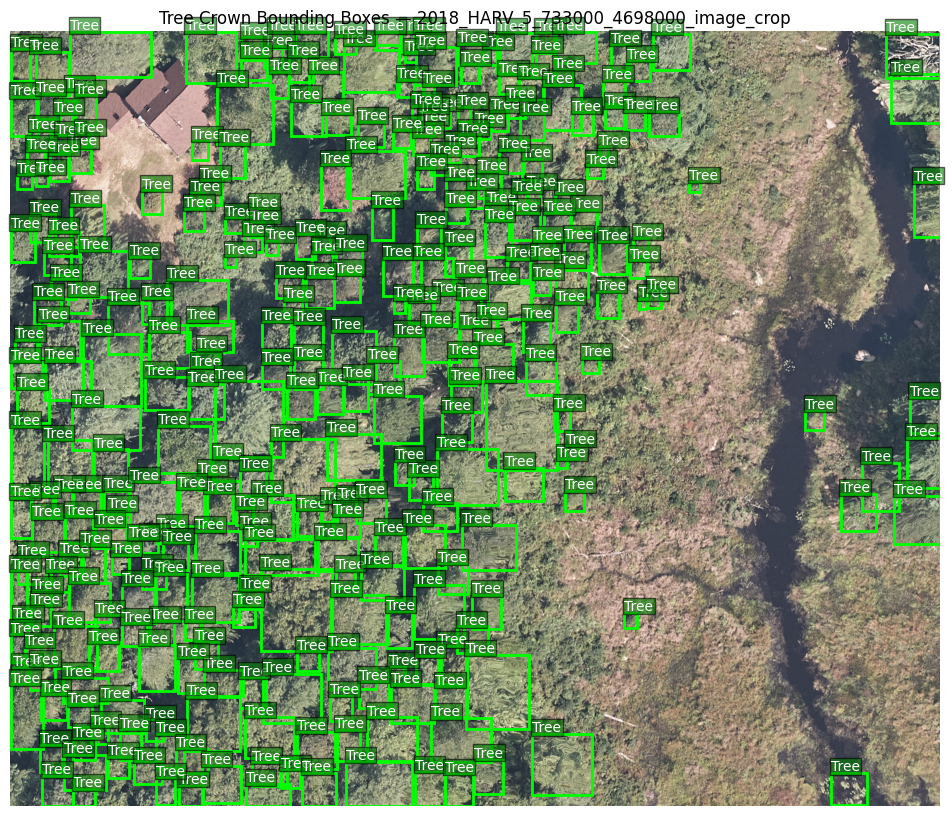

In [71]:


import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image

LABEL_MAP = {"Tree": 1, "Larch": 2, "Other": 3}  # background = 0

# Paths
xml_file   = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations/2018_HARV_5_733000_4698000_image_crop.xml"
image_file = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/2018_HARV_5_733000_4698000_image_crop.tif"

# 1. Parse XML
tree = ET.parse(xml_file)
root = tree.getroot()

# 2. Load the TIFF with PIL instead of tifffile
with Image.open(image_file) as img:
    image = np.array(img)

# 3. Plot
fig, ax = plt.subplots(1, figsize=(12, 12))
ax.imshow(image)

# 4. Overlay bounding boxes & labels
for obj in root.findall('object'):
    # pick <tree> then fallback to <name>
    text = None
    if obj.find("tree") is not None and obj.find("tree").text:
        text = obj.find("tree").text.strip()
    elif obj.find("name") is not None and obj.find("name").text:
        text = obj.find("name").text.strip()
    cls_name = text.title() if text else "Other"
    
    # map to numeric if needed
    label_id = LABEL_MAP.get(cls_name, LABEL_MAP["Other"])
    
    # bbox coords
    bb = obj.find('bndbox')
    xmin, ymin = int(bb.find('xmin').text), int(bb.find('ymin').text)
    xmax, ymax = int(bb.find('xmax').text), int(bb.find('ymax').text)

    # draw rectangle & text
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin,
                             linewidth=2, edgecolor='lime', facecolor='none')
    ax.add_patch(rect)
    ax.text(xmin, ymin-5, cls_name, fontsize=10, color='white',
            bbox=dict(facecolor='green', alpha=0.6, pad=1))

plt.axis('off')
plt.title("Tree Crown Bounding Boxes — 2018_HARV_5_733000_4698000_image_crop")
plt.show()


In [72]:
import os
import glob
import xml.etree.ElementTree as ET
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt

# ——— Paths ———
BASE_DIR   = "/kaggle/input/tree-crown-dataset/neon-dataset"
RGB_DIR    = os.path.join(BASE_DIR, "training", "RGB")
ANN_DIR    = os.path.join(BASE_DIR, "annotations")

# ——— Build df_stats ———
records = []
for img_path in sorted(glob.glob(os.path.join(RGB_DIR, "*.tif"))):
    stem = os.path.splitext(os.path.basename(img_path))[0]
    xml_path = os.path.join(ANN_DIR, stem + ".xml")
    
    # Image dimensions & file size
    with Image.open(img_path) as img:
        w, h = img.size
    size_mb = os.path.getsize(img_path) / (1024**2)
    
    # Object counts
    counts = {"Tree":0, "Larch":0, "Other":0}
    if os.path.exists(xml_path):
        tree = ET.parse(xml_path)
        root = tree.getroot()
        for obj in root.findall("object"):
            # get class text from <tree> or <name>
            text = None
            if obj.find("tree") is not None and obj.find("tree").text:
                text = obj.find("tree").text.strip()
            elif obj.find("name") is not None and obj.find("name").text:
                text = obj.find("name").text.strip()
            cls = text.title() if text else "Other"
            counts[cls if cls in counts else "Other"] += 1
    
    total = sum(counts.values())
    records.append({
        "image": stem,
        "width": w,
        "height": h,
        "size_mb": round(size_mb, 2),
        "trees": counts["Tree"],
        "larchs": counts["Larch"],
        "other": counts["Other"],
        "objects": total,
        "aspect_ratio": w / h
    })

df_stats = pd.DataFrame(records)

# ——— Min/Max summary table ———
summary = []
for cls in ["trees", "larchs", "other"]:
    mn = df_stats[cls].min()
    mx = df_stats[cls].max()
    img_min = df_stats.loc[df_stats[cls] == mn, "image"].tolist()
    img_max = df_stats.loc[df_stats[cls] == mx, "image"].tolist()
    summary.append({
        "Class": cls.title(),
        "Min Count": mn,
        "Image(s) with Min": img_min,
        "Max Count": mx,
        "Image(s) with Max": img_max
    })
summary_df = pd.DataFrame(summary)



/usr/local/lib/python3.11/dist-packages/PIL/Image.py:3402: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


### Min/Max Objects per Class



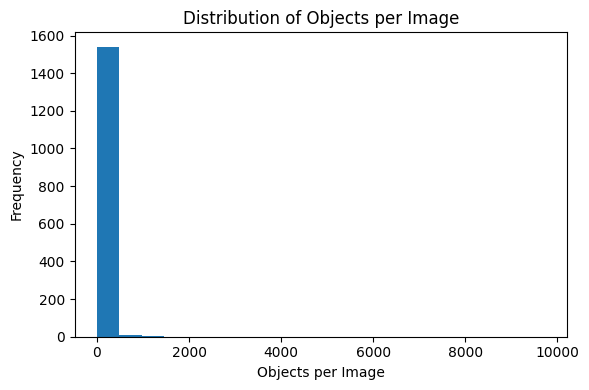

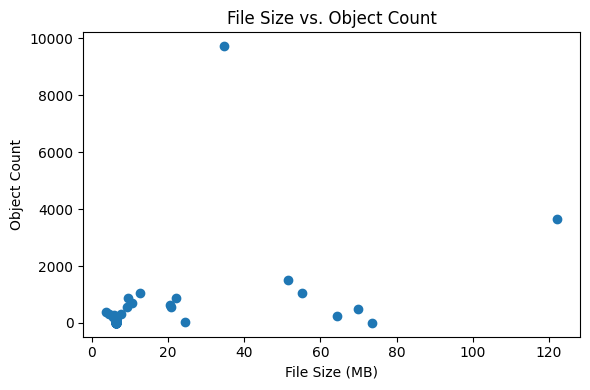

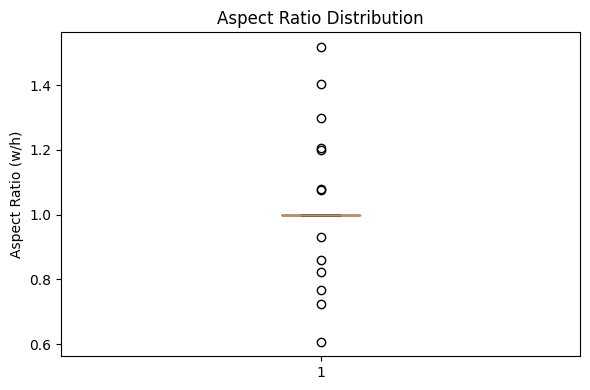

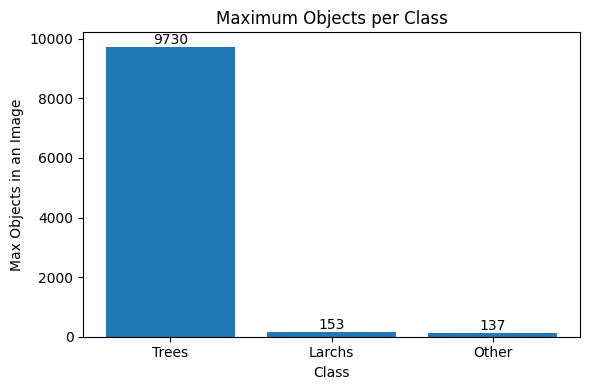

In [46]:
# Print summary table
print("### Min/Max Objects per Class\n")
# print(summary_df.to_markdown(index=False))

# ——— Visualizations ———

# 1) Distribution of objects per image
plt.figure(figsize=(6,4))
plt.hist(df_stats["objects"], bins=20)
plt.xlabel("Objects per Image")
plt.ylabel("Frequency")
plt.title("Distribution of Objects per Image")
plt.tight_layout()
plt.show()

# 2) File size vs. object count scatter
plt.figure(figsize=(6,4))
plt.scatter(df_stats["size_mb"], df_stats["objects"])
plt.xlabel("File Size (MB)")
plt.ylabel("Object Count")
plt.title("File Size vs. Object Count")
plt.tight_layout()
plt.show()

# 3) Aspect ratio boxplot
plt.figure(figsize=(6,4))
plt.boxplot(df_stats["aspect_ratio"])
plt.ylabel("Aspect Ratio (w/h)")
plt.title("Aspect Ratio Distribution")
plt.tight_layout()
plt.show()

# 4) Max objects per class bar chart
plt.figure(figsize=(6,4))
bars = plt.bar(summary_df["Class"], summary_df["Max Count"])
for bar, mc in zip(bars, summary_df["Max Count"]):
    plt.text(bar.get_x()+bar.get_width()/2, mc+1, str(mc),
             ha="center", va="bottom")
plt.xlabel("Class")
plt.ylabel("Max Objects in an Image")
plt.title("Maximum Objects per Class")
plt.tight_layout()
plt.show()


<div style="background-color:#f7fafc; border-left:6px solid #2c5282; padding:1.2em; font-family:'Segoe UI', sans-serif;">

<h2 style="color:#2c5282;">📈 Insights of Analysis of Dataset Visualizations</h2>

---

<h3 style="color:#2c5282;">1. Distribution of Objects per Image</h3>
<p>
The histogram shows most images contain relatively few tree‐crown objects, with a long right‐tail of very “crowded” tiles.
</p>
<blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282;">
<strong>Definition:</strong> A <em>distribution plot</em> (histogram) groups images by their object counts to reveal how common each count is.
</blockquote>

---

<h3 style="color:#2c5282;">2. File Size vs. Object Count</h3>
<p>
The scatter plot reveals a loose positive trend: larger TIFF files (in MB) tend to contain more annotated objects—but with notable outliers (e.g., one file at ~35 MB with ~9,800 objects).
</p>
<blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282;">
<strong>Definition:</strong> A <em>scatter plot</em> displays the relationship between two numeric variables (here, file size and object count).
</blockquote>

---

<h3 style="color:#2c5282;">3. Aspect Ratio Distribution</h3>
<p>
The boxplot of <code>width/height</code> shows most images are near a 1:1 ratio, with a handful of more rectangular tiles.
</p>
<blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282;">
<strong>Definition:</strong> A <em>boxplot</em> summarizes a numeric distribution by its quartiles (25%, 50%, 75%) and highlights outliers.
</blockquote>

---

<h3 style="color:#2c5282;">4. Maximum Objects in a Single Image</h3>
<p>We computed the per‑class maximum number of objects found in any one tile:</p>

<table style="background-color:#e6fffa; padding:1em; border-radius:8px; width:100%; border-collapse:collapse;">
  <thead>
    <tr style="background-color:#cbd5e0;">
      <th style="text-align:left; padding:0.5em;">Class</th>
      <th style="text-align:right; padding:0.5em;">Max Objects in One Image</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td style="padding:0.5em;"><strong>Tree</strong></td>
      <td style="text-align:right; padding:0.5em;">9,730</td>
    </tr>
    <tr>
      <td style="padding:0.5em;"><strong>Larch</strong></td>
      <td style="text-align:right; padding:0.5em;">153</td>
    </tr>
    <tr>
      <td style="padding:0.5em;"><strong>Other</strong></td>
      <td style="text-align:right; padding:0.5em;">137</td>
    </tr>
  </tbody>
</table>

<blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282; margin-top:1em;">
This tells us that one image contains nearly <strong>10 k</strong> tree crowns—an extreme case you may wish to sample or subdivide during training.
</blockquote>

</div>


<h1 style="color:#2c5282;">📊 Train, Validation & Test Data exploration</h1>

In [9]:
import os
import glob
from PIL import Image
import pandas as pd

BASE_DIR = "/kaggle/input/tree-crown-dataset/neon-dataset"
SPLITS = ["train", "val", "test"]

summary = []

for split in SPLITS:
    folder_path = os.path.join(BASE_DIR, split)
    tif_files = sorted(glob.glob(os.path.join(folder_path, "*.tif")))[:100]  # only first 100

    if len(tif_files) == 0:
        continue

    widths, heights, sizes_kb = [], [], []

    for f in tif_files:
        with Image.open(f) as img:
            w, h = img.size
            widths.append(w)
            heights.append(h)

        sizes_kb.append(os.path.getsize(f) / 1024)

    summary.append({
        "split": split,
        "num_images_checked": len(tif_files),
        "min_width": min(widths),
        "max_width": max(widths),
        "min_height": min(heights),
        "max_height": max(heights),
        "mean_size_kb": round(sum(sizes_kb) / len(sizes_kb), 2),
        "unique_resolutions": len(set(zip(widths, heights)))
    })

df_summary = pd.DataFrame(summary)
from IPython.display import display, HTML

# Assuming df_summary is already created
# 1. Show as a styled DataFrame with bar charts for key columns
styled = (
    df_summary
    .style
    .set_caption("📊 Image Properties by Split (first 100 samples)")
    # color bars for resolution range
    .bar(subset=["min_width", "max_width", "min_height", "max_height"], color="#A6CEE3")
    # color bar for mean size
    .bar(subset=["mean_size_kb"], color="#B2DF8A")
    .format({
        "mean_size_kb": "{:.2f} KB"
    })
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "bottom"), ("font-size", "1.1em"), ("color", "#333")]},
        {"selector": "th",      "props": [("background-color", "#f7f7f7"), ("font-weight", "bold")]},
        {"selector": "td",      "props": [("padding", "0.5em")]},
    ])
)

display(styled)

,split,num_images_checked,min_width,max_width,min_height,max_height,mean_size_kb,unique_resolutions
0,train,100,256,256,256,256,192.27 KB,1
1,val,100,256,256,256,256,192.27 KB,1
2,test,100,400,400,400,400,543.31 KB,1


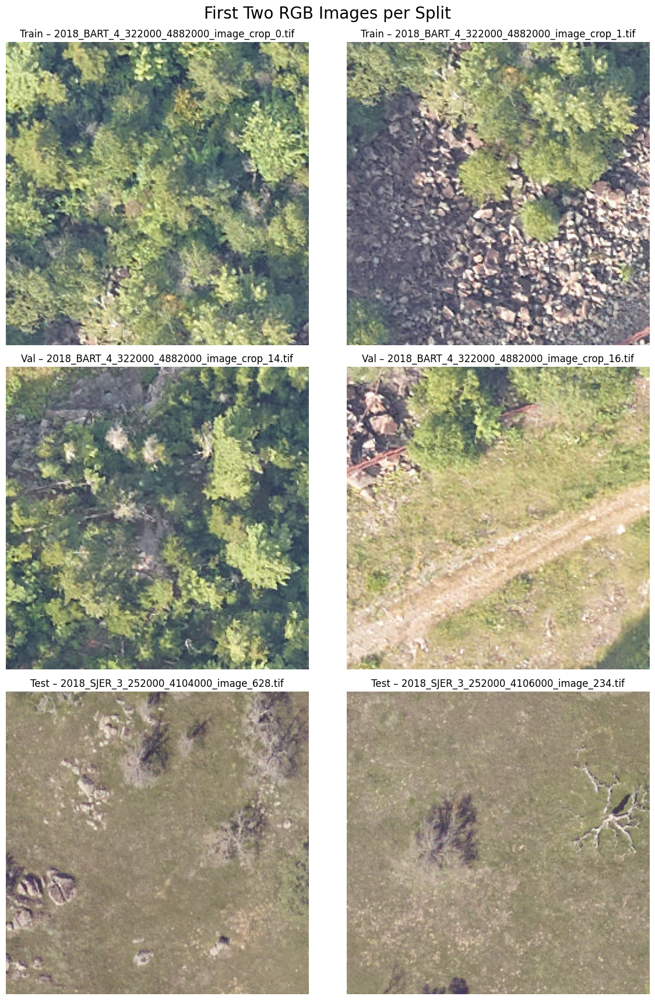

In [15]:
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt

# Base directory
BASE_DIR = "/kaggle/input/tree-crown-dataset/neon-dataset"

# Splits to visualize
splits = ["train", "val", "test"]

fig, axes = plt.subplots(len(splits), 2, figsize=(12, 18))
fig.suptitle("First Two RGB Images per Split", fontsize=20, y=0.95)

for row, split in enumerate(splits):
    folder = os.path.join(BASE_DIR, split)
    tif_paths = sorted(glob.glob(os.path.join(folder, "*.tif")))[:2]
    
    for col, img_path in enumerate(tif_paths):
        # Load via PIL (handles LZW compression)
        with Image.open(img_path) as img:
            # Ensure RGB ordering
            img = img.convert("RGB")
            arr = np.array(img)
        
        ax = axes[row, col]
        ax.imshow(arr)
        ax.set_title(f"{split.capitalize()} – {os.path.basename(img_path)}", fontsize=12)
        ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [16]:
import os
import glob
import pandas as pd

# Path to your cropped RGB tiles
crop_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/train"
crop_paths = sorted(glob.glob(os.path.join(crop_dir, "*.tif")))

records = []
for p in crop_paths[:10]:  # just show first 10 for illustration
    fname = os.path.basename(p)
    name, _ = os.path.splitext(fname)
    parts = name.split("_")
    
    # Reconstruct the full-image ID from the first 5 parts
    full_id = "_".join(parts[:5]) + ".tif"
    
    records.append({
        "crop_filename": fname,
        "crop_parts": "_".join(parts[5:]),    # e.g. "image_crop"
        "full_image": full_id
    })

df = pd.DataFrame(records)
print(df.to_markdown(index=False))


| crop_filename                                | crop_parts    | full_image                     |
|:---------------------------------------------|:--------------|:-------------------------------|
| 2018_BART_4_322000_4882000_image_crop_0.tif  | image_crop_0  | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_1.tif  | image_crop_1  | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_10.tif | image_crop_10 | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_11.tif | image_crop_11 | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_12.tif | image_crop_12 | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_13.tif | image_crop_13 | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_15.tif | image_crop_15 | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000_4882000_image_crop_17.tif | image_crop_17 | 2018_BART_4_322000_4882000.tif |
| 2018_BART_4_322000

In [21]:
import os
import glob
import random
import pandas as pd

def map_crops_to_full(training_dir, evaluation_dir, split_dirs, sample_size=100):
    """
    For each split, sample up to sample_size .tif files and map each crop
    back to its full image using your two-step lookup:
      1) Try base name as-is
      2) If not found, strip trailing "_<number>"
    """
    records = []

    for split, folder in split_dirs.items():
        # gather all .tif in this split
        all_files = sorted(glob.glob(os.path.join(folder, "*.tif")))
        sample = random.sample(all_files, min(sample_size, len(all_files)))
        
        for img_path in sample:
            img_filename = os.path.basename(img_path)
            name_noext   = img_filename[:-4]    # drop .tif
            base_name    = name_noext
            crop_index   = 0
            is_cropped   = False

            # 1a) Try “as-is”
            full_path = os.path.join(training_dir, base_name + ".tif")
            if not os.path.exists(full_path):
                full_path = os.path.join(evaluation_dir, base_name + ".tif")
            
            # 1b) If not found, strip trailing _<number>
            if not os.path.exists(full_path):
                parts = name_noext.rsplit("_", 1)
                if len(parts) == 2 and parts[1].isdigit():
                    base_name  = parts[0]
                    crop_index = int(parts[1])
                    is_cropped = True
                    # retry
                    full_path = os.path.join(training_dir, base_name + ".tif")
                    if not os.path.exists(full_path):
                        full_path = os.path.join(evaluation_dir, base_name + ".tif")
            
            # If still missing, mark explicitly
            if not os.path.exists(full_path):
                full_path = None  # or keep as string ending in “.tif” if you prefer
                        
            records.append({
                "split": split,
                "crop_file": img_filename,
                "full_path": full_path,
                "is_cropped": is_cropped,
                "crop_index": crop_index
            })

    return pd.DataFrame(records)


# ——— Usage ———
BASE_DIR      = "/kaggle/input/tree-crown-dataset/neon-dataset"
TRAINING_DIR  = os.path.join(BASE_DIR, "training",   "RGB")
EVALUATION_DIR= os.path.join(BASE_DIR, "evaluation", "RGB")
SPLIT_DIRS    = {
    "train": os.path.join(BASE_DIR, "train"),
    "val":   os.path.join(BASE_DIR, "val"),
    "test":  os.path.join(BASE_DIR, "test"),
}

df_mapping = map_crops_to_full(
    training_dir   = TRAINING_DIR,
    evaluation_dir = EVALUATION_DIR,
    split_dirs     = SPLIT_DIRS,
    sample_size    = 100
)

# Quick summary of mapping success
print(df_mapping.groupby("split")["full_path"].apply(lambda s: s.notnull().mean()).rename("pct_found"))

# Inspect any missing
missing = df_mapping[df_mapping["full_path"].isnull()]
if not missing.empty:
    print("\nMissing mappings (first few):")
    print(missing.head())


split
test     1.0
train    1.0
val      1.0
Name: pct_found, dtype: float64


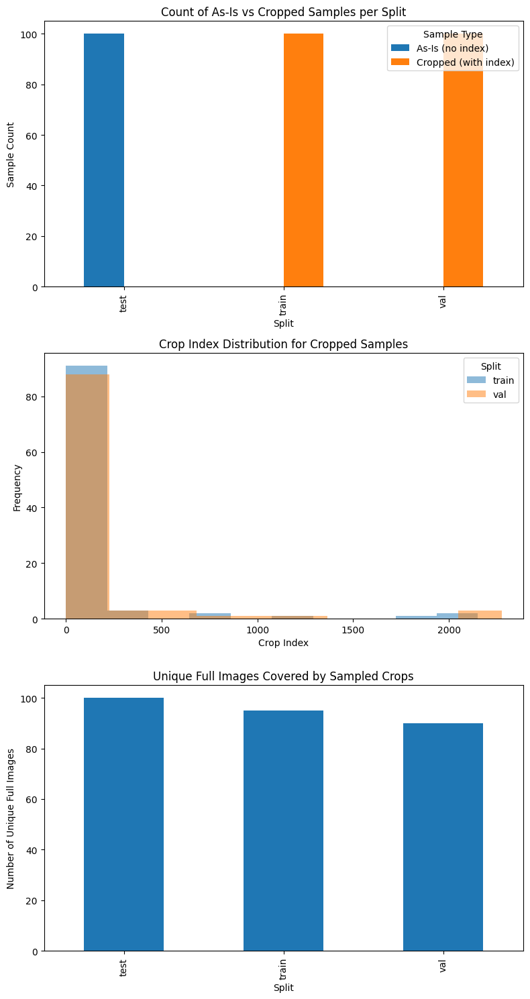

,Total Samples,Cropped Samples,As-Is Samples,Unique Fulls
split,,,,
test,100,0,100,100
train,100,100,0,95
val,100,100,0,90


In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_mapping is already in your environment; if not, rebuild it as shown previously.

# Sample data recreation for demonstration (remove this if df_mapping is available)
# df_mapping = pd.read_csv('/mnt/data/df_mapping.csv')

# 1. Compute counts of is_cropped per split
crop_counts = df_mapping.groupby(['split', 'is_cropped']).size().unstack(fill_value=0)

# 2. Distribution of crop_index (>0 only)
crop_index_dist = df_mapping[df_mapping['is_cropped']].groupby('split')['crop_index']

# 3. Unique full images per split
unique_full = df_mapping.groupby('split')['full_path'].nunique()

# Plotting
fig, axes = plt.subplots(3, 1, figsize=(8, 15))

# a) Bar chart: number of as-is vs cropped samples per split
crop_counts.plot(kind='bar', ax=axes[0])
axes[0].set_title('Count of As-Is vs Cropped Samples per Split')
axes[0].set_xlabel('Split')
axes[0].set_ylabel('Sample Count')
axes[0].legend(['As-Is (no index)', 'Cropped (with index)'], title='Sample Type')

# b) Histogram: crop_index distribution for cropped samples
for split, group in crop_index_dist:
    axes[1].hist(group, alpha=0.5, label=split)
axes[1].set_title('Crop Index Distribution for Cropped Samples')
axes[1].set_xlabel('Crop Index')
axes[1].set_ylabel('Frequency')
axes[1].legend(title='Split')

# c) Bar chart: unique full images covered
unique_full.plot(kind='bar', ax=axes[2])
axes[2].set_title('Unique Full Images Covered by Sampled Crops')
axes[2].set_xlabel('Split')
axes[2].set_ylabel('Number of Unique Full Images')

plt.tight_layout()
plt.show()

# Display a summary table
summary_table = pd.DataFrame({
    'Total Samples': df_mapping.groupby('split').size(),
    'Cropped Samples': crop_counts[True],
    'As-Is Samples': crop_counts[False],
    'Unique Fulls': unique_full
})
display(summary_table)


<div style="background-color:#f7fafc; border-left:6px solid #2c5282; padding:1.2em; font-family:'Segoe UI', sans-serif;"> <h2 style="color:#2c5282;">📊 Summary of Train, Validation & Test Splits</h2>
<h3 style="color:#2c5282;">1. Tile Properties (Based on 100 Random Samples)</h3> <p>The following table captures the <em>resolution</em>, <em>average file size</em>, and <em>unique resolution counts</em> in each split.</p> <table style="background-color:#e6fffa; padding:1em; border-radius:8px; width:100%; border-collapse:collapse; margin-bottom:1em;"> <thead> <tr style="background-color:#cbd5e0;"> <th style="text-align:left; padding:0.5em;">Split</th> <th style="text-align:center; padding:0.5em;">Resolution</th> <th style="text-align:center; padding:0.5em;">Avg. File Size</th> <th style="text-align:center; padding:0.5em;">Unique Resolutions</th> </tr> </thead> <tbody> <tr> <td style="padding:0.5em;"><strong>Train</strong></td> <td style="text-align:center; padding:0.5em; color:#3182CE;">256×256 px</td> <td style="text-align:center; padding:0.5em; color:#3182CE;">192.27 KB</td> <td style="text-align:center; padding:0.5em; color:#3182CE;">1</td> </tr> <tr> <td style="padding:0.5em;"><strong>Validation</strong></td> <td style="text-align:center; padding:0.5em; color:#3182CE;">256×256 px</td> <td style="text-align:center; padding:0.5em; color:#3182CE;">192.27 KB</td> <td style="text-align:center; padding:0.5em; color:#3182CE;">1</td> </tr> <tr> <td style="padding:0.5em;"><strong>Test</strong></td> <td style="text-align:center; padding:0.5em; color:#D53F8C;">400×400 px</td> <td style="text-align:center; padding:0.5em; color:#D53F8C;">543.31 KB</td> <td style="text-align:center; padding:0.5em; color:#D53F8C;">1</td> </tr> </tbody> </table> <blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282;"> <strong>Insight:</strong> Train & Validation tiles are uniform 256×256 (~192 KB). Test tiles remain larger (400×400, ~543 KB), indicating a different cropping strategy. </blockquote>
<h3 style="color:#2c5282;">2. Crop ↔ Full-Tile Mapping</h3> <p>We sampled 100 crops per split and located their parent full images using exact-name and indexed lookup. The table below shows how they matched:</p> <table style="background-color:#e6fffa; padding:1em; border-radius:8px; width:100%; border-collapse:collapse; margin-bottom:1em;"> <thead> <tr style="background-color:#cbd5e0;"> <th style="text-align:left; padding:0.5em;">Split</th> <th style="text-align:center; padding:0.5em;">Total Samples</th> <th style="text-align:center; padding:0.5em;">As-Is Matches</th> <th style="text-align:center; padding:0.5em;">Indexed Matches</th> <th style="text-align:center; padding:0.5em;">Unique Parents</th> </tr> </thead> <tbody> <tr> <td style="padding:0.5em;"><strong>Test</strong></td> <td style="text-align:center; padding:0.5em;">100</td> <td style="text-align:center; padding:0.5em; color:#48BB78;">100</td> <td style="text-align:center; padding:0.5em; color:#E53E3E;">0</td> <td style="text-align:center; padding:0.5em;">100</td> </tr> <tr> <td style="padding:0.5em;"><strong>Train</strong></td> <td style="text-align:center; padding:0.5em;">100</td> <td style="text-align:center; padding:0.5em; color:#E53E3E;">0</td> <td style="text-align:center; padding:0.5em; color:#48BB78;">100</td> <td style="text-align:center; padding:0.5em;">95</td> </tr> <tr> <td style="padding:0.5em;"><strong>Validation</strong></td> <td style="text-align:center; padding:0.5em;">100</td> <td style="text-align:center; padding:0.5em; color:#E53E3E;">0</td> <td style="text-align:center; padding:0.5em; color:#48BB78;">100</td> <td style="text-align:center; padding:0.5em;">90</td> </tr> </tbody> </table> <blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282;"> <strong>Observation:</strong> Test crops match full-tile names directly. Train/Val use indexed suffixes (e.g. _001), covering slightly fewer unique parents. </blockquote>
<h3 style="color:#2c5282;">3. Folder Modality Coverage</h3> <p>All splits include <span style="color:#38A169;"><strong>RGB</strong></span> crops. However, <span style="color:#4A5568;"><strong>CHM</strong></span>, <span style="color:#4A5568;"><strong>LiDAR</strong></span>, and <span style="color:#4A5568;"><strong>Hyperspectral</strong></span> full-tiles are available <em>only</em> under the <span style="color:#3182CE;"><strong>training/</strong></span> folder.</p> <blockquote style="background-color:#e2e8f0; padding:0.8em; border-left:4px solid #2c5282;"> <span class="note">Note:</span> Validation and Test splits lack these additional modalities, so downstream models must handle their absence. </blockquote>
<h3 style="color:#2c5282;">🚀 Next Steps</h3> <ul> <li>📋 <strong>Document</strong> the Test-set size/resolution discrepancy.</li> <li>🔍 <strong>Visualize</strong> sample crops overlaid on full orthomosaics to verify spatial context.</li> <li>📦 <strong>Proceed</strong> to per-box EDA (area, aspect ratio, class frequencies) before training.</li> </ul> </div>







In [46]:
import os
import glob
import random
import pandas as pd

def map_crops_to_full(training_dir, evaluation_dir, split_dirs, form = "",  sample_size=100):
    """
    For each split, sample up to sample_size .tif files and map each crop
    back to its full image using your two-step lookup:
      1) Try base name as-is
      2) If not found, strip trailing "_<number>"
    """
    records = []

    for split, folder in split_dirs.items():
        # gather all .tif in this split
        all_files = sorted(glob.glob(os.path.join(folder, "*.tif")))
        sample = random.sample(all_files, min(sample_size, len(all_files)))
        
        for img_path in sample:
            img_filename = os.path.basename(img_path)
            name_noext   = img_filename[:-4]    # drop .tif
            base_name    = name_noext
            crop_index   = 0
            is_cropped   = False
            
            if form != "":
                
                base_name = base_name + form
                           
            # 1a) Try “as-is”
            full_path = os.path.join(training_dir, base_name +  ".tif")
            if not os.path.exists(full_path):
                full_path = os.path.join(evaluation_dir, base_name +   ".tif")
            
            # 1b) If not found, strip trailing _<number>
            if not os.path.exists(full_path):
                parts = name_noext.rsplit("_", 1)
                if len(parts) == 2 and parts[1].isdigit():
                    base_name  = parts[0]
                    crop_index = int(parts[1])
                    is_cropped = True
                    # retry
                    full_path = os.path.join(training_dir, base_name +  ".tif")
                    if not os.path.exists(full_path):
                        full_path = os.path.join(evaluation_dir, base_name + ".tif")
            
            # If still missing, mark explicitly
            if not os.path.exists(full_path):
                full_path = None  # or keep as string ending in “.tif” if you prefer
                        
            records.append({
                "split": split,
                "crop_file": img_filename,
                "full_path": full_path,
                "is_cropped": is_cropped,
                "crop_index": crop_index
            })

    return pd.DataFrame(records)


# ——— Usage ———
BASE_DIR      = "/kaggle/input/tree-crown-dataset/neon-dataset"
TRAINING_DIR  = os.path.join(BASE_DIR, "training",   "Hyperspectral")
EVALUATION_DIR= os.path.join(BASE_DIR, "evaluation", "Hyperspectral")
SPLIT_DIRS    = {
    "train": os.path.join(BASE_DIR, "train"),
    "val":   os.path.join(BASE_DIR, "val"),
    "test":  os.path.join(BASE_DIR, "test"),
}

df_mapping = map_crops_to_full(
    training_dir   = TRAINING_DIR,
    evaluation_dir = EVALUATION_DIR,
    split_dirs     = SPLIT_DIRS,
    form = "_hyperspectral",
    sample_size    = 100
)

# Quick summary of mapping success
print(df_mapping.groupby("split")["full_path"].apply(lambda s: s.notnull().mean()).rename("pct_found"))

# Inspect any missing
missing = df_mapping[df_mapping["full_path"].isnull()]
if not missing.empty:
    print("\nMissing mappings (first few):")
    print(missing.head())


split
test     1.0
train    0.0
val      0.0
Name: pct_found, dtype: float64

Missing mappings (first few):
   split        crop_file full_path  is_cropped  crop_index
0  train  B04_0023_39.tif      None        True          39
1  train  B05_0023_49.tif      None        True          49
2  train  B07_0173_21.tif      None        True          21
3  train  B06_0142_57.tif      None        True          57
4  train  B07_0129_31.tif      None        True          31


In [57]:
import os
import glob
import random
import pandas as pd

def map_crops_to_full(training_dir, evaluation_dir, split_dirs, form = "",  sample_size=100):
    """
    For each split, sample up to sample_size .tif files and map each crop
    back to its full image using your two-step lookup:
      1) Try base name as-is
      2) If not found, strip trailing "_<number>"
    """
    records = []

    for split, folder in split_dirs.items():
        # gather all .tif in this split
        all_files = sorted(glob.glob(os.path.join(folder, "*.tif")))
        sample = random.sample(all_files, min(sample_size, len(all_files)))
        
        for img_path in sample:
            img_filename = os.path.basename(img_path)
            name_noext   = img_filename[:-4]    # drop .tif
            base_name    = name_noext
            crop_index   = 0
            is_cropped   = False
            # print(base_name)
            
            if form != "":                
                  base_name = base_name + form
            # print(base_name)
                           
            # 1a) Try “as-is”
            full_path = os.path.join(training_dir, base_name +  ".tif")
            if not os.path.exists(full_path):
                full_path = os.path.join(evaluation_dir, base_name +   ".tif")
            
            # 1b) If not found, strip trailing _<number>
            if not os.path.exists(full_path):
                parts = name_noext.rsplit("_", 1)
                if len(parts) == 2 and parts[1].isdigit():
                    base_name  = parts[0]
                    crop_index = int(parts[1])
                    is_cropped = True
                    # retry
                    full_path = os.path.join(training_dir, base_name +  ".tif")
                    if not os.path.exists(full_path):
                        full_path = os.path.join(evaluation_dir, base_name + ".tif")
            
            # If still missing, mark explicitly
            if not os.path.exists(full_path):
                full_path = None  # or keep as string ending in “.tif” if you prefer
                        
            records.append({
                "split": split,
                "crop_file": img_filename,
                "full_path": full_path,
                "is_cropped": is_cropped,
                "crop_index": crop_index
            })

    return pd.DataFrame(records)


# ——— Usage ———
BASE_DIR      = "/kaggle/input/tree-crown-dataset/neon-dataset"
TRAINING_DIR  = os.path.join(BASE_DIR, "training",   "Hyperspectral")
EVALUATION_DIR= os.path.join(BASE_DIR, "evaluation", "Hyperspectral")
SPLIT_DIRS    = {
    "train": os.path.join(BASE_DIR, "train"),
    "val":   os.path.join(BASE_DIR, "val"),
    "test":  os.path.join(BASE_DIR, "test"),
}

df_mapping = map_crops_to_full(
    training_dir   = TRAINING_DIR,
    evaluation_dir = EVALUATION_DIR,
    split_dirs     = SPLIT_DIRS,
    form = "_CHM",
    sample_size    = 5
)

# Quick summary of mapping success
print(df_mapping.groupby("split")["full_path"].apply(lambda s: s.notnull().mean()).rename("pct_found"))

# Inspect any missing
missing = df_mapping[df_mapping["full_path"].isnull()]
if not missing.empty:
    print("\nMissing mappings (first few):")
    print(missing.head())


split
test     0.0
train    0.0
val      0.0
Name: pct_found, dtype: float64

Missing mappings (first few):
   split                                  crop_file full_path  is_cropped  \
0  train  2018_SJER_3_258000_4106000_image_2345.tif      None        True   
1  train                            B07_0111_18.tif      None        True   
2  train                            B02_0122_61.tif      None        True   
3  train                            B04_0072_62.tif      None        True   
4  train                            B07_0084_19.tif      None        True   

   crop_index  
0        2345  
1          18  
2          61  
3          62  
4          19  


In [56]:
import os
import glob
import random
import pandas as pd

def map_crops_to_full(training_dir, evaluation_dir, split_dirs, form = "",  sample_size=100):
    """
    For each split, sample up to sample_size .tif files and map each crop
    back to its full image using your two-step lookup:
      1) Try base name as-is
      2) If not found, strip trailing "_<number>"
    """
    records = []

    for split, folder in split_dirs.items():
        # gather all .tif in this split
        all_files = sorted(glob.glob(os.path.join(folder, "*.tif")))
        sample = random.sample(all_files, min(sample_size, len(all_files)))
        
        for img_path in sample:
            img_filename = os.path.basename(img_path)
            name_noext   = img_filename[:-4]    # drop .tif
            base_name    = name_noext
            crop_index   = 0
            is_cropped   = False
            # print(base_name)
            
            if form != "":                
                  base_name = base_name + form
            # print(base_name)
                           
            # 1a) Try “as-is”
            full_path = os.path.join(training_dir, base_name +  ".laz")
            if not os.path.exists(full_path):
                full_path = os.path.join(evaluation_dir, base_name +   ".laz")
            
            # 1b) If not found, strip trailing _<number>
            if not os.path.exists(full_path):
                parts = name_noext.rsplit("_", 1)
                if len(parts) == 2 and parts[1].isdigit():
                    base_name  = parts[0]
                    crop_index = int(parts[1])
                    is_cropped = True
                    # retry
                    full_path = os.path.join(training_dir, base_name +  ".laz")
                    if not os.path.exists(full_path):
                        full_path = os.path.join(evaluation_dir, base_name + ".laz")
            
            # If still missing, mark explicitly
            if not os.path.exists(full_path):
                full_path = None  # or keep as string ending in “.tif” if you prefer
                        
            records.append({
                "split": split,
                "crop_file": img_filename,
                "full_path": full_path,
                "is_cropped": is_cropped,
                "crop_index": crop_index
            })

    return pd.DataFrame(records)


# ——— Usage ———
BASE_DIR      = "/kaggle/input/tree-crown-dataset/neon-dataset"
TRAINING_DIR  = os.path.join(BASE_DIR, "training",   "Hyperspectral")
EVALUATION_DIR= os.path.join(BASE_DIR, "evaluation", "Hyperspectral")
SPLIT_DIRS    = {
    "train": os.path.join(BASE_DIR, "train"),
    "val":   os.path.join(BASE_DIR, "val"),
    "test":  os.path.join(BASE_DIR, "test"),
}

df_mapping = map_crops_to_full(
    training_dir   = TRAINING_DIR,
    evaluation_dir = EVALUATION_DIR,
    split_dirs     = SPLIT_DIRS,
    form = "",
    sample_size    = 10
)

# Quick summary of mapping success
print(df_mapping.groupby("split")["full_path"].apply(lambda s: s.notnull().mean()).rename("pct_found"))

# Inspect any missing
missing = df_mapping[df_mapping["full_path"].isnull()]
if not missing.empty:
    print("\nMissing mappings (first few):")
    print(missing.head())


split
test     0.0
train    0.0
val      0.0
Name: pct_found, dtype: float64

Missing mappings (first few):
   split        crop_file full_path  is_cropped  crop_index
0  train   B02_0115_4.tif      None        True           4
1  train  B01_0106_62.tif      None        True          62
2  train  B01_0177_54.tif      None        True          54
3  train   B02_0083_9.tif      None        True           9
4  train  B06_0068_19.tif      None        True          19


<div style="background-color:#f0f8ff; border-left:6px solid #3182ce; padding:1.5em; font-family:'Segoe UI', sans-serif; color:#2d3748;">

  <h1 style="color:#2b6cb0; font-size:1.6em; margin-top:0;">🔍 Modality Coverage & Full-Tile Availability</h1>
  <p>
    Our dataset contains four modalities—<strong>RGB</strong>, <strong>CHM</strong>, <strong>LiDAR</strong>, and <strong>Hyperspectral</strong>—but only <span style="background:#718096; color:white; padding:0.2em 0.5em; border-radius:4px;">RGB</span> has a comprehensive collection of full‐tile images. The remaining three share a limited subset of orthomosaics.
  </p>

  <h3 style="color:#2c5282;">👁️‍🗨️ Available Orthomosaic IDs for CHM, LiDAR & Hyperspectral</h3>
  <pre style="background-color:#ffffff; padding:1em; border:1px solid #cbd5e0; border-radius:6px; overflow-x:auto;">
<span style="background:#38a169; color:white; padding:0.2em 0.5em; border-radius:4px;">CHM</span>
2018_BART_4_322000_4882000
2018_HARV_5_733000_4698000
2018_JERC_4_742000_3451000
2018_MLBS_3_541000_4140000
2018_NIWO_2_450000_4426000
2018_OSBS_4_405000_3286000
2018_SJER_3_258000_4106000
2018_SJER_3_259000_4110000
2018_TEAK_3_315000_4094000
2019_DELA_5_423000_3601000
2019_LENO_5_383000_3523000
2019_OSBS_5_405000_3287000
2019_SJER_4_251000_4103000
2019_TOOL_3_403000_7617000

<span style="background:#4299e1; color:white; padding:0.2em 0.5em; border-radius:4px;">LiDAR</span> & <span style="background:#d53f8c; color:white; padding:0.2em 0.5em; border-radius:4px;">Hyperspectral</span>
(Same IDs as CHM orthomosaics)
  </pre>

  <p style="font-style:italic; color:#4a5568; margin-top:0.5em;">
    💡 These 16 orthomosaic IDs are the only full‐tiles available for CHM, LiDAR, and Hyperspectral—every other crop in those folders must map back to one of these.
  </p>

  <h3 style="color:#2c5282;">📊 RGB Full-Tile Inventory</h3>
  <p>
    The <span style="background:#718096; color:white; padding:0.2em 0.5em; border-radius:4px;">RGB</span> modality contains <strong>>1,500</strong> full‐tile IDs in <code>training/RGB/</code>, offering extensive coverage across all regions, especially the “Tree” class.
  </p>
  <p style="font-style:italic; color:#4a5568;">
    📝 CHM, LiDAR, and Hyperspectral predominantly contain “Larch” and “Other” class tiles due to limited orthomosaic coverage.
  </p>

  <h3 style="color:#2c5282;">🚧 Next Steps: Crop‐to‐Tile Mapping</h3>
  <ul>
    <li>🔄 <strong>Map each crop</strong> to the 16 known orthomosaics using base IDs.</li>
    <li>🔍 <strong>Validate</strong> crop–tile associations and flag unmatched items.</li>
    <li>📂 <strong>Compile</strong> a lookup table to support downstream model training.</li>
  </ul>

  <div style="color:#e53e3e; font-weight:bold; margin-top:1em;">⚠️ Note:</div>
  <p style="font-style:italic; color:#4a5568;">
    Since CHM, LiDAR, and Hyperspectral lack broad “Tree” region coverage, consider excluding or augmenting them when modeling that class.
  </p>

</div>


<div style="background-color:#f0f8ff; border-left:6px solid #3182ce; padding:1.5em; font-family:'Segoe UI', sans-serif; color:#2d3748;">

  <h1>🔁 Reverse Engineering Cropping Offsets</h1>

  <p><em>To map each cropped tile back to its exact full-image coordinates, follow this workflow diagram:</em></p>

  <div class="diagram">
    <!-- If using Mermaid.js, include the script reference before this -->
    <pre class="mermaid">
flowchart TD
  A[Step 1<br/>Select Full-Tile Images] --> B[Step 2<br/>List Cropped Tiles]
  B --> C[Step 3<br/>Compute (x, y) Offsets]
  C --> D[Step 4<br/>Infer Stride & Overlap]
  D --> E[Why Offset Mapping Matters]
    </pre>
  </div>

  <h3>🔹 Step 1: Pick Full-Tile References</h3>
  <p><strong>What:</strong> Choose large images with known tile sets<br>
     <strong>Example paths:</strong></p>
  <pre>/full-training/RGB/2018_BART_4_322000_4882000_image.tif
/full-training/RGB/2018_SJER_3_259000_4110000_image.tif</pre>

  <h3>🔹 Step 2: List Cropped Tiles</h3>
  <p><strong>What:</strong> Collect all tiles for each full image; filenames include a tile index.<br>
     <strong>Example filenames:</strong></p>
  <pre>…/train/…_image_crop_24.tif
…/train/…_image_crop_26.tif
…/train/…_image_crop_07.tif
…/train/…_image_crop_15.tif</pre>

  <h3>🔹 Step 3: Compute (x, y) Offsets</h3>
  <ol>
    <li><strong>Extract index:</strong> From <code>…_image_crop_17.tif</code> → <code>index = 17</code></li>
    <li><strong>Effective region:</strong>
      <pre>eff_width  = full_width  &ndash; 2·margin_x
eff_height = full_height &ndash; 2·margin_y</pre>
    </li>
    <li><strong>Rows per column:</strong>
      <pre>n_rows = ⌊(eff_height &ndash; crop_size) / stride⌋ + 1</pre>
    </li>
    <li><strong>Column &amp; row:</strong>
      <pre>col = index // n_rows
row = index % n_rows</pre>
    </li>
    <li><strong>Raw offsets:</strong>
      <pre>raw_x = col × stride
raw_y = row × stride</pre>
    </li>
    <li><strong>Clamp inside:</strong>
      <pre>x_eff = min(raw_x, eff_width &ndash; crop_size)
y_eff = min(raw_y, eff_height &ndash; crop_size)</pre>
    </li>
    <li><strong>Full-image coords:</strong>
      <pre>x = x_eff + margin_x
y = y_eff + margin_y</pre>
    </li>
  </ol>

  <div class="note">
    <strong>Note:</strong> These steps recover the true pixel position of each tile’s top-left corner.
  </div>

  <h3>🔹 Step 4: Infer Stride &amp; Overlap</h3>
  <ol>
    <li><strong>Given:</strong>
      <ul>
        <li>Tile size <code>P</code> (e.g. 256 px)</li>
        <li>A set of deduced <code>(x,y)</code> offsets</li>
      </ul>
    </li>
    <li><strong>Infer stride <code>S</code>:</strong>
      <ul>
        <li>Horizontal gaps <code>Δx</code> where <code>y</code> is constant</li>
        <li>Vertical gaps <code>Δy</code> where <code>x</code> is constant</li>
        <li><code>S = mode(Δx, Δy)</code> (most common non-zero gap)</li>
      </ul>
    </li>
    <li><strong>Compute overlap <code>O</code>:</strong>
      <pre>O = P &ndash; S</pre>
    </li>
    <li><strong>Half-patch (optional):</strong>
      <pre>half = ⌊P/2⌋</pre>
    </li>
  </ol>

  <h3>🎯 Why Offset Mapping Matters</h3>
  <ul>
    <li><strong>Precise Annotation Alignment:</strong> Ensures boxes and masks align exactly on the original image.</li>
    <li><strong>Consistent Evaluation:</strong> Merges tile-based predictions for accurate IoU, precision, and recall.</li>
    <li><strong>Tile Fusion (WBF):</strong> Combines overlapping predictions into a single coherent view.</li>
  </ul>

  <p>By following this workflow, you can fully reconstruct each crop’s location in the full image—crucial for robust training, evaluation, and post-processing.</p>



In [58]:
import os

# Base directory where all folders are located
base_dir = "/kaggle/input/tree-crown-dataset/neon-dataset"

# Target filename pattern
target_prefix = "2018_BART_4_322000_4882000_image_crop"

# Folders to search
folders = ["evaluation/rgb", "train", "test", "val"]

# Collect matching file paths
matching_paths = []

for folder in folders:
    full_path = os.path.join(base_dir, folder)
    if not os.path.exists(full_path):
        continue

    for root, _, files in os.walk(full_path):
        for file in files:
            if file.endswith(".tif") and target_prefix in file:
                matching_paths.append(os.path.join(root, file))

# Print all matching crop image paths
for path in matching_paths:
    print(path)

# Optional: also print total count
print(f"\nTotal crops found: {len(matching_paths)}")


/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_10.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_24.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_26.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_7.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_15.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_1.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_12.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_5.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_3.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_11.tif
/kaggle/input/tree-crown-dataset/n

In [59]:
import os
from PIL import Image
import numpy as np
from skimage.feature import match_template

def load_grayscale(image_path):
    return np.array(Image.open(image_path).convert("L"))

def find_best_match_offset(full_img, crop_img):
    result = match_template(full_img, crop_img, pad_input=True)
    ij = np.unravel_index(np.argmax(result), result.shape)
    return ij[::-1]  # (x_offset, y_offset)

# Path to full RGB image
full_image_path = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/2018_BART_4_322000_4882000_image_crop.tif"

# All crop paths (train + val)
crop_paths = [
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_0.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_1.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_2.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_3.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_5.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_6.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_7.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_8.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_9.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_10.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_11.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_12.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_13.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_15.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_17.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_18.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_19.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_20.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_21.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_23.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_24.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_26.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_28.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_29.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_BART_4_322000_4882000_image_crop_14.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_BART_4_322000_4882000_image_crop_16.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_BART_4_322000_4882000_image_crop_22.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_BART_4_322000_4882000_image_crop_25.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_BART_4_322000_4882000_image_crop_27.tif",
]

# Load the full image (grayscale)
full_gray = load_grayscale(full_image_path)

# Process each crop
for crop_path in crop_paths:
    crop_gray = load_grayscale(crop_path)
    x_offset, y_offset = find_best_match_offset(full_gray, crop_gray)
    print(f"{os.path.basename(crop_path)} --> Offset in full image: (x={x_offset}, y={y_offset})")


2018_BART_4_322000_4882000_image_crop_0.tif --> Offset in full image: (x=128, y=128)
2018_BART_4_322000_4882000_image_crop_1.tif --> Offset in full image: (x=128, y=320)
2018_BART_4_322000_4882000_image_crop_2.tif --> Offset in full image: (x=128, y=512)
2018_BART_4_322000_4882000_image_crop_3.tif --> Offset in full image: (x=128, y=704)
2018_BART_4_322000_4882000_image_crop_5.tif --> Offset in full image: (x=320, y=128)
2018_BART_4_322000_4882000_image_crop_6.tif --> Offset in full image: (x=320, y=320)
2018_BART_4_322000_4882000_image_crop_7.tif --> Offset in full image: (x=320, y=512)
2018_BART_4_322000_4882000_image_crop_8.tif --> Offset in full image: (x=320, y=704)
2018_BART_4_322000_4882000_image_crop_9.tif --> Offset in full image: (x=320, y=760)
2018_BART_4_322000_4882000_image_crop_10.tif --> Offset in full image: (x=512, y=128)
2018_BART_4_322000_4882000_image_crop_11.tif --> Offset in full image: (x=512, y=320)
2018_BART_4_322000_4882000_image_crop_12.tif --> Offset in full

In [60]:
import os

# Base directory where all folders are located
base_dir = "/kaggle/input/tree-crown-dataset/neon-dataset"

# Target filename pattern
target_prefix = "2018_HARV_5_733000_4698000_image_crop"

# Folders to search
folders = ["evaluation/rgb", "train", "test", "val"]

# Collect matching file paths
matching_paths = []

for folder in folders:
    full_path = os.path.join(base_dir, folder)
    if not os.path.exists(full_path):
        continue

    for root, _, files in os.walk(full_path):
        for file in files:
            if file.endswith(".tif") and target_prefix in file:
                matching_paths.append(os.path.join(root, file))

# Print all matching crop image paths
for path in matching_paths:
    print(path)

# Optional: also print total count
print(f"\nTotal crops found: {len(matching_paths)}")


/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_17.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_15.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_59.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_10.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_53.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_23.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_5.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_7.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_28.tif
/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_33.tif
/kaggle/input/tree-crown-dataset

In [61]:
import os
import math
from PIL import Image

# 1. Function to compute crop offset with margin and column-major indexing
def compute_crop_offset_with_margin(index, full_width, full_height,
                                    crop_size=256, stride=192,
                                    margin_x=128, margin_y=128):
    """
    Returns (x_offset, y_offset) for the given crop index, assuming:
      • the “effective” region of the full image is shrunken by margin_x/margin_y on all sides,
      • tiles of size crop_size are placed with the given stride (e.g. 192 = 0.75 * 256),
      • indexing is column-major (down each column first).
    """
    # Effective dimensions after trimming margins
    eff_width  = full_width  - 2 * margin_x
    eff_height = full_height - 2 * margin_y

    # How many vertical steps (rows) fit before hitting the bottom of the effective region
    n_rows = math.floor((eff_height - crop_size) / stride) + 1

    # Column-major → compute (col, row)
    col = index // n_rows
    row = index % n_rows

    # Raw offsets inside the effective region
    raw_x = col * stride
    raw_y = row * stride

    # Clamp so we never exceed the effective region
    x_off_eff = min(raw_x, eff_width  - crop_size)
    y_off_eff = min(raw_y, eff_height - crop_size)

    # Add back the trimmed margin to get the true offset in the full image
    x_offset = x_off_eff + margin_x
    y_offset = y_off_eff + margin_y

    return x_offset, y_offset


# 2. Path to the full image for HARV site
full_image_path = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/2018_HARV_5_733000_4698000_image_crop.tif"

# 3. All crop paths for HARV (train + val), as provided
crop_paths = [
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_17.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_15.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_59.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_10.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_53.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_23.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_5.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_7.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_28.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_33.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_27.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_1.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_29.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_56.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_19.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_8.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_52.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_40.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_3.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_16.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_20.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_45.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_35.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_2.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_36.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_13.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_42.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_62.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_50.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_49.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_37.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_26.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_14.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_18.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_6.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_57.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_38.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_43.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_HARV_5_733000_4698000_image_crop_31.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_30.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_22.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_34.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_60.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_39.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_4.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_55.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_0.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_12.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_11.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_25.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_9.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_21.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_32.tif",
    "/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_HARV_5_733000_4698000_image_crop_24.tif",
]

# 4. Load the full image to get its dimensions
full_img = Image.open(full_image_path)
full_width, full_height = full_img.size

# 5. Iterate over each crop, compute offset, and print
for crop_path in crop_paths:
    # Extract index from filename
    filename = os.path.basename(crop_path)
    idx = int(filename.rsplit("_", 1)[1].split(".")[0])

    # Compute offset
    x_off, y_off = compute_crop_offset_with_margin(
        idx,
        full_width,
        full_height,
        crop_size=256,
        stride=192,
        margin_x=128,
        margin_y=128
    )

    print(f"{filename} --> Offset in full image: (x={x_off}, y={y_off})")


2018_HARV_5_733000_4698000_image_crop_17.tif --> Offset in full image: (x=704, y=512)
2018_HARV_5_733000_4698000_image_crop_15.tif --> Offset in full image: (x=704, y=128)
2018_HARV_5_733000_4698000_image_crop_59.tif --> Offset in full image: (x=1250, y=896)
2018_HARV_5_733000_4698000_image_crop_10.tif --> Offset in full image: (x=512, y=128)
2018_HARV_5_733000_4698000_image_crop_53.tif --> Offset in full image: (x=1250, y=704)
2018_HARV_5_733000_4698000_image_crop_23.tif --> Offset in full image: (x=896, y=704)
2018_HARV_5_733000_4698000_image_crop_5.tif --> Offset in full image: (x=320, y=128)
2018_HARV_5_733000_4698000_image_crop_7.tif --> Offset in full image: (x=320, y=512)
2018_HARV_5_733000_4698000_image_crop_28.tif --> Offset in full image: (x=1088, y=704)
2018_HARV_5_733000_4698000_image_crop_33.tif --> Offset in full image: (x=1250, y=704)
2018_HARV_5_733000_4698000_image_crop_27.tif --> Offset in full image: (x=1088, y=512)
2018_HARV_5_733000_4698000_image_crop_1.tif --> Off

In [63]:
def compute_offsets(dim, patch_size=256, overlap=64):
    """
    Compute all valid “top‐left corner” offsets along one axis (width or height)
    for overlapping patches of size patch_size × patch_size, with the specified overlap.
    This ensures:
      1. The first patch is centered at (patch_size // 2).
      2. Each subsequent patch moves by stride = patch_size – overlap.
      3. The final patch is forced so its right/bottom edge lands exactly on `dim`.

    Args:
      dim (int):      The length of this axis (e.g., image width or height).
      patch_size (int): The size of each square patch (default: 256).
      overlap (int):  Number of pixels overlapped between adjacent patches (default: 64).

    Returns:
      List[int]: A sorted list of integer offsets along this axis.
    """
    P = patch_size
    O = overlap
    S = P - O                 # stride between adjacent patches (e.g., 256 – 64 = 192)
    half = P // 2             # half‐patch (e.g., 128)

    offsets = []
    x = half
    # 1) March in steps of S while the patch‐center stays ≤ (dim – half).
    while x <= dim - half:
        offsets.append(x)
        x += S

    # 2) Force the last patch to end exactly on the border if needed.
    last = dim - half
    if offsets[-1] != last:
        offsets.append(last)

    return offsets


def get_all_crops(image_width, image_height, patch_size=256, overlap=64):
    """
    Given the full image size (image_width × image_height), compute a list of
    (crop_index, x_offset, y_offset) for every 256×256 patch with 64px overlap.
    Offsets (x_offset, y_offset) are the top‐left coordinates of each patch 
    in the full image. The `crop_index` runs from 0 upward in “x‐outer, y‐inner” order.

    Args:
      image_width (int):   Full image width (e.g., 1153 or 1634).
      image_height (int):  Full image height (e.g., 888 or 1361).
      patch_size (int):    Size of each square patch (default: 256).
      overlap (int):       Overlap in pixels between adjacent patches (default: 64).

    Returns:
      List[Tuple[int,int,int]]: A list of triples (crop_index, x_offset, y_offset).
                                - crop_index: integer 0, 1, 2, …
                                - x_offset:   top‐left x coordinate of that patch
                                - y_offset:   top‐left y coordinate of that patch
    """
    x_offsets = compute_offsets(image_width, patch_size, overlap)
    y_offsets = compute_offsets(image_height, patch_size, overlap)

    crops = []
    idx = 0
    # “x” is the outer loop, “y” is the inner loop, so that:
    #   Crop 0  → (x_off[0], y_off[0])
    #   Crop 1  → (x_off[0], y_off[1])
    #   …
    #   Crop N  → (x_off[0], y_off[end])
    #   Crop N+1→ (x_off[1], y_off[0]), etc.
    for x0 in x_offsets:
        for y0 in y_offsets:
            crops.append((idx, x0, y0))
            idx += 1

    return crops


# if __name__ == "__main__":
# Example 1: For 1153×888 (same as before)
print("\n--- 1153×888 offsets ---\n")
W1, H1 = 1153, 888
crop_list1 = get_all_crops(W1, H1, patch_size=256, overlap=64)
for idx, x_off, y_off in crop_list1:
    print(f"Crop {idx:02d} → Offset in full image: (x={x_off}, y={y_off})")

# Example 2: For 1634×1361 (your new example)
print("\n--- 1634×1361 offsets ---\n")
W2, H2 = 1634, 1361
crop_list2 = get_all_crops(W2, H2, patch_size=256, overlap=64)
for idx, x_off, y_off in crop_list2:
    print(f"Crop {idx:02d} → Offset in full image: (x={x_off}, y={y_off})")



--- 1153×888 offsets ---

Crop 00 → Offset in full image: (x=128, y=128)
Crop 01 → Offset in full image: (x=128, y=320)
Crop 02 → Offset in full image: (x=128, y=512)
Crop 03 → Offset in full image: (x=128, y=704)
Crop 04 → Offset in full image: (x=128, y=760)
Crop 05 → Offset in full image: (x=320, y=128)
Crop 06 → Offset in full image: (x=320, y=320)
Crop 07 → Offset in full image: (x=320, y=512)
Crop 08 → Offset in full image: (x=320, y=704)
Crop 09 → Offset in full image: (x=320, y=760)
Crop 10 → Offset in full image: (x=512, y=128)
Crop 11 → Offset in full image: (x=512, y=320)
Crop 12 → Offset in full image: (x=512, y=512)
Crop 13 → Offset in full image: (x=512, y=704)
Crop 14 → Offset in full image: (x=512, y=760)
Crop 15 → Offset in full image: (x=704, y=128)
Crop 16 → Offset in full image: (x=704, y=320)
Crop 17 → Offset in full image: (x=704, y=512)
Crop 18 → Offset in full image: (x=704, y=704)
Crop 19 → Offset in full image: (x=704, y=760)
Crop 20 → Offset in full image: (

<div style="background-color:#f0fff4; border-left:8px solid #38a169; padding:1.2em; font-family:'Segoe UI', sans-serif;">


<div>
  <h2>⚙️ Trial-and-Error Offset Calculation Method Final Values</h2>
  <ul>
    <li><strong >Patch Size (P):</strong> 256 px</li>
    <li><strong >Overlap (O):</strong> 64 px</li>
    <li><strong >Stride (S = P – O):</strong> 192 px</li>
    <li><strong >Half-Patch (P // 2):</strong> 128 px</li>
  </ul>
  <ol>
    <li><strong >Center-Based Anchors</strong><br>
        Start each patch by its <em>center</em> at <code>128 px</code> from the image border.</li>
    <li><strong >Fixed Stride March</strong><br>
        Move centers by <code>192 px</code> to maintain <code>64 px</code> overlap.</li>
    <li><strong >Edge-Clamp Correction</strong><br>
        Append final center at <code>dim – 128 px</code> if it isn't already included.</li>
    <li><strong >2D Grid Enumeration</strong><br>
        Enumerate all x-centers, then y-centers (“x-outer, y-inner”) to assign indices.</li>
  </ol>

  <p><strong >Key Insight:</strong>  
     With <code>P=256</code>, <code>O=64</code>, <code>S=192</code>, and <code>half=128</code>,  
     this method ensures full coverage, uniform overlap, and a clear indexing scheme.</p>
</div>


<h1 style="color:#2b6cb0; font-size:2em; font-family:'Segoe UI', sans-serif;">🖼️ Visualization of Bounding Boxes on Full Image Tiles</h1>
<hr>

<div style="background-color:#f0fff4; border-left:6px solid #38a169; padding:1.2em; font-family:'Segoe UI', sans-serif;">
  <h3 style="color:#2f855a;">🎯 <strong>Purpose of This Section</strong></h3>
  <ul>
    <li>To <strong>visually validate</strong> the alignment between RGB full image tiles and their corresponding annotations.</li>
    <li>To check if <strong>bounding boxes</strong> correctly enclose tree crowns at full resolution.</li>
    <li>To confirm the dataset's <strong>annotation quality</strong> before applying any cropping or tiling strategy.</li>
  </ul>
</div>

<div style="margin-top:1.2em; font-family:'Segoe UI', sans-serif;">
  <h3 style="color:#805ad5;">📌 <strong>Key Insights</strong></h3>
  <ul>
    <li>Bounding boxes will be drawn on full-resolution images using <code>matplotlib</code>.</li>
    <li>Random samples will be inspected for annotation consistency.</li>
    <li>Helps identify issues like <em>shifted boxes</em>, <em>missing labels</em>, or <em>scale mismatches</em>.</li>
  </ul>
</div>

<p style="font-size:1.1em; font-family:'Segoe UI', sans-serif; color:#1a202c;">
  ✅ <strong>This step is critical to ensure dataset integrity before training any object detection model.</strong>
</p>


In [7]:
import os
from PIL import Image
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def compute_offsets(dim, patch_size=256, overlap=64):
    """
    Compute all valid “top‐left corner” offsets along one axis (width or height)
    for overlapping patches of size patch_size × patch_size, with the specified overlap.
    Algorithm:
      1) stride = patch_size – overlap  (e.g. 256 – 64 = 192)
      2) offsets = [0, stride, 2*stride, ...] as long as “start + patch_size <= dim”
      3) If the last offset + patch_size < dim, append one final offset = (dim – patch_size)
         so the last patch ends exactly at the border.
    Returns:
      List[int]: A sorted list of all integer offsets along that axis.
    """
    P = patch_size
    S = P - overlap
    offsets = list(range(0, dim - P + 1, S))
    last = dim - P
    if offsets[-1] != last:
        offsets.append(last)
    return offsets

def get_all_crops(image_width, image_height, patch_size=256, overlap=64):
    """
    Given full-image dimensions (image_width × image_height), return a list of
    (crop_index, x_offset, y_offset) for every patch of size patch_size×patch_size,
    with the specified overlap. Offsets are the top-left corner of each patch in full-image coords.
    crop_index runs from 0 upward in “x-outer, y-inner” order.
    Returns:
      List[Tuple[int, int, int]]  # (crop_index, x_offset, y_offset)
    """
    x_offsets = compute_offsets(image_width, patch_size, overlap)
    y_offsets = compute_offsets(image_height, patch_size, overlap)
    crops = []
    idx = 0
    for x0 in x_offsets:
        for y0 in y_offsets:
            crops.append((idx, x0, y0))
            idx += 1
    return crops

def debug_visualize_crop_with_boxes(
    crop_img_path,
    annotation_dir,
    training_dir,
    evaluation_dir,
    crop_size=256,
    overlap=64
):
    """
    1) Given the path `crop_img_path` (which might be a true crop or might already be a full image),
       attempt to locate the full-image TIFF in this order:
         a) Check if full_image_dir + "/" + filename(without extension) + ".tif" exists.
            If yes, treat that as the full image (is_cropped=False, crop_index=0).
         b) Otherwise, remove only the trailing "_<number>" from the filename (if present),
            parse that trailing number as crop_index, and use the remainder as base_name.
            Then attempt to find training_dir/base_name+".tif"; if not found, try evaluation_dir/base_name+".tif".
            If that exists, treat as a crop with index = that number (is_cropped=True).
    2) Load the full image and its annotation XML (annotation_dir/base_name+".xml").
    3) If is_cropped=True, compute (crop_x, crop_y) for patch number = crop_index via overlapping‐tiling logic.
    4) Display:
       - FULL IMAGE with all bboxes (blue) and crop rectangle (red) if is_cropped.
       - CROP (or full) image with clipped bboxes (red).
    """
    crop_filename = os.path.basename(crop_img_path)
    name_noext, ext = os.path.splitext(crop_filename)
    if ext.lower() != ".tif":
        raise ValueError(f"Expected a .tif file, got: {crop_filename}")

    # 1a) Attempt: use the filename (no stripping) as a full image
    base_name = name_noext
    crop_index = 0
    is_cropped = False

    # First check training_dir, then evaluation_dir
    full_img_path = os.path.join(training_dir, base_name + ".tif")
    if not os.path.exists(full_img_path):
        full_img_path = os.path.join(evaluation_dir, base_name + ".tif")
    if os.path.exists(full_img_path):
        # We found the full image directly; no cropping
        is_cropped = False
        crop_index = 0
    else:
        # 1b) Remove only the trailing "_<number>", if present
        parts = name_noext.rsplit("_", 1)
        if len(parts) != 2 or not parts[1].isdigit():
            raise FileNotFoundError(
                f"Could not find full image for '{crop_filename}', and filename does not end with '_<number>'."
            )
        base_name = parts[0]                # e.g. "2018_MLBS_..._image_crop2"
        crop_index = int(parts[1])          # e.g. 72
        is_cropped = True

        # Now attempt to find base_name+".tif" in training/evaluation
        full_img_path = os.path.join(training_dir, base_name + ".tif")
        if not os.path.exists(full_img_path):
            full_img_path = os.path.join(evaluation_dir, base_name + ".tif")
        if not os.path.exists(full_img_path):
            raise FileNotFoundError(
                f"After stripping '_<number>', could not find full image: {base_name}.tif"
            )

    # 2) Locate annotation
    annotation_path = os.path.join(annotation_dir, base_name + ".xml")
    if not os.path.exists(annotation_path):
        raise FileNotFoundError(f"Annotation not found: {annotation_path}")

    # Load full image for dimensions and plotting
    full_img = Image.open(full_img_path)
    full_width, full_height = full_img.size

    # 3) If is_cropped, compute (crop_x, crop_y); else (0,0)
    if is_cropped:
        crops = get_all_crops(
            image_width=full_width,
            image_height=full_height,
            patch_size=crop_size,
            overlap=overlap
        )
        max_index = len(crops) - 1
        if not (0 <= crop_index <= max_index):
            raise ValueError(f"crop_index {crop_index} is out of range [0, {max_index}]")
        _, crop_x, crop_y = crops[crop_index]
    else:
        crop_x, crop_y = 0, 0

    # 4) Load the display image (could be a crop or the full image)
    display_img = Image.open(crop_img_path)

    # Parse the annotation XML
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    # ------- Part 1: FULL IMAGE with all bboxes (blue), crop rect (red if cropped) -------
    fig_full, ax_full = plt.subplots(figsize=(8, 6))
    ax_full.imshow(full_img)
    title = f"Full image: base_name={base_name}"
    if is_cropped:
        title += f", crop_index={crop_index}"
    ax_full.set_title(title)

    # Draw every bounding box in blue dashed
    for obj in root.findall(".//object"):
        bbox = obj.find("bndbox")
        xmin = int(float(bbox.find("xmin").text))
        ymin = int(float(bbox.find("ymin").text))
        xmax = int(float(bbox.find("xmax").text))
        ymax = int(float(bbox.find("ymax").text))
        w = xmax - xmin
        h = ymax - ymin
        rect_box = patches.Rectangle(
            (xmin, ymin), w, h,
            linewidth=1.0, edgecolor="blue", facecolor="none", linestyle="--"
        )
        ax_full.add_patch(rect_box)

    # Draw the crop rectangle if this is actually a crop
    if is_cropped:
        rect_crop = patches.Rectangle(
            (crop_x, crop_y), crop_size, crop_size,
            linewidth=2.0, edgecolor="red", facecolor="none"
        )
        ax_full.add_patch(rect_crop)

    ax_full.axis("off")

    # ------- Part 2: Display the crop (or full image) with clipped bboxes in red -------
    fig_crop, ax_crop = plt.subplots(figsize=(4, 4))
    ax_crop.imshow(display_img)
    if is_cropped:
        ax_crop.set_title(f"Crop #{crop_index} (local coords 0..{crop_size})")
    else:
        ax_crop.set_title("Full image (no '_<number>' cropping)")

    if is_cropped:
        # Clip & draw only boxes within the 256×256 crop
        for obj in root.findall(".//object"):
            bbox = obj.find("bndbox")
            xmin = int(float(bbox.find("xmin").text))
            ymin = int(float(bbox.find("ymin").text))
            xmax = int(float(bbox.find("xmax").text))
            ymax = int(float(bbox.find("ymax").text))

            if xmax <= crop_x or xmin >= crop_x + crop_size:
                continue
            if ymax <= crop_y or ymin >= crop_y + crop_size:
                continue

            clipped_xmin = max(xmin, crop_x) - crop_x
            clipped_ymin = max(ymin, crop_y) - crop_y
            clipped_xmax = min(xmax, crop_x + crop_size) - crop_x
            clipped_ymax = min(ymax, crop_y + crop_size) - crop_y

            w = clipped_xmax - clipped_xmin
            h = clipped_ymax - clipped_ymin
            rect = patches.Rectangle(
                (clipped_xmin, clipped_ymin), w, h,
                linewidth=1.5, edgecolor="red", facecolor="none"
            )
            ax_crop.add_patch(rect)
    else:
        # If not a crop, draw all full-image boxes in red
        for obj in root.findall(".//object"):
            bbox = obj.find("bndbox")
            xmin = int(float(bbox.find("xmin").text))
            ymin = int(float(bbox.find("ymin").text))
            xmax = int(float(bbox.find("xmax").text))
            ymax = int(float(bbox.find("ymax").text))
            w = xmax - xmin
            h = ymax - ymin
            rect_box = patches.Rectangle(
                (xmin, ymin), w, h,
                linewidth=1.0, edgecolor="red", facecolor="none"
            )
            ax_crop.add_patch(rect_box)

    ax_crop.axis("off")
    plt.show()




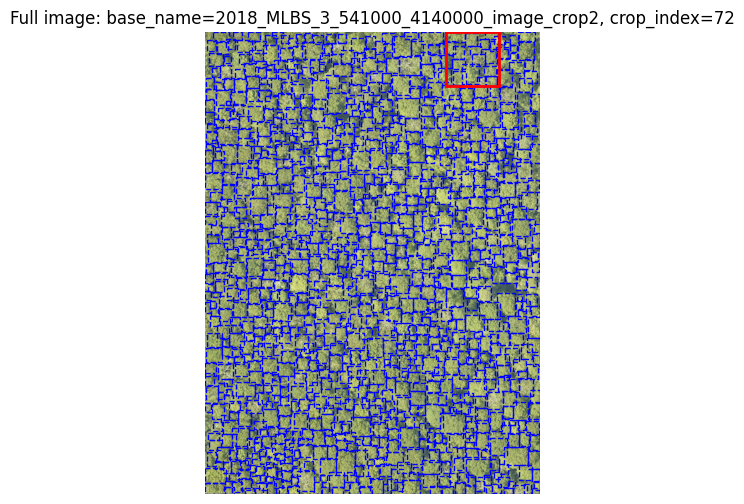

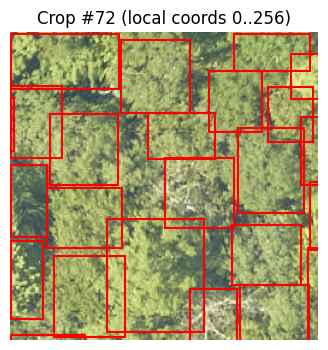

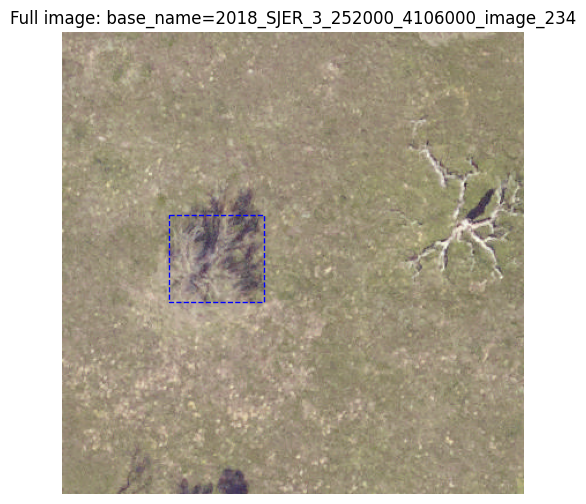

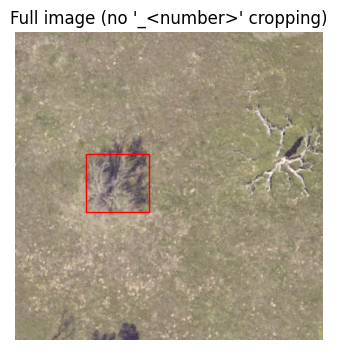

In [65]:

# Case 1: Filename contains "_crop"
debug_visualize_crop_with_boxes(
    crop_img_path="/kaggle/input/tree-crown-dataset/neon-dataset/val/2018_MLBS_3_541000_4140000_image_crop2_72.tif",
    annotation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/annotations/",
    training_dir="/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/",
    evaluation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/evaluation/RGB/",
    crop_size=256,
    overlap=64
)

# Case 2: Filename does NOT contain "_crop"
debug_visualize_crop_with_boxes(
    crop_img_path="/kaggle/input/tree-crown-dataset/neon-dataset/test/2018_SJER_3_252000_4106000_image_234.tif",
    annotation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/annotations/",
    training_dir="/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/",
    evaluation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/evaluation/RGB/",
    crop_size=256,
    overlap=64
)


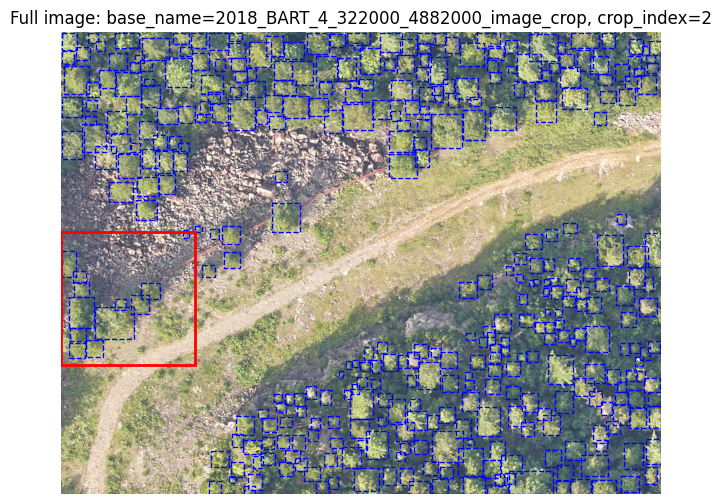

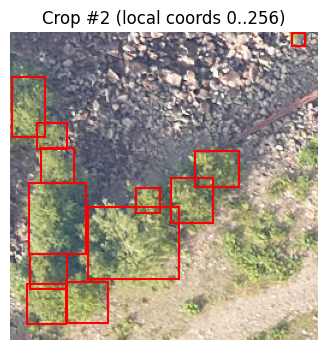

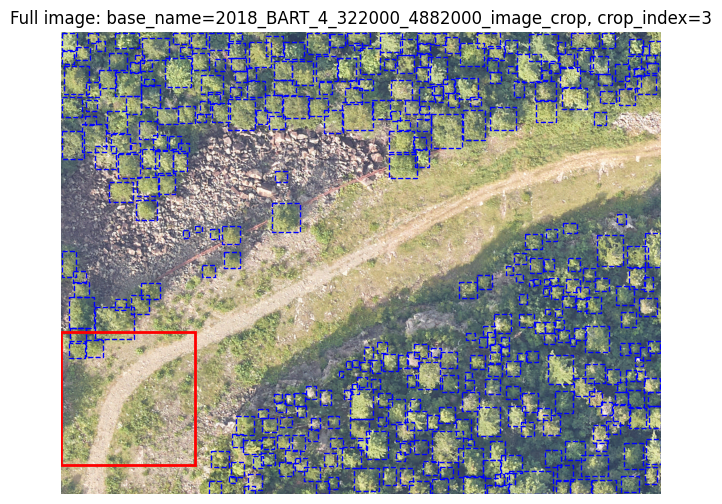

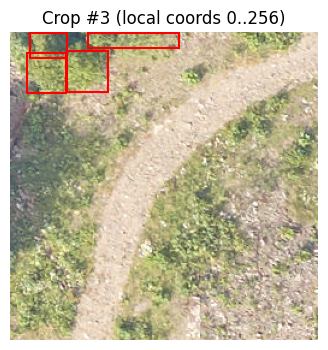

In [69]:
debug_visualize_crop_with_boxes(
    crop_img_path="/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_2.tif",
    annotation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/annotations/",
    training_dir="/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/",
    evaluation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/evaluation/RGB/",
    crop_size=256,
    overlap=64
)

debug_visualize_crop_with_boxes(
    crop_img_path="/kaggle/input/tree-crown-dataset/neon-dataset/train/2018_BART_4_322000_4882000_image_crop_3.tif",
    annotation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/annotations/",
    training_dir="/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/",
    evaluation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/evaluation/RGB/",
    crop_size=256,
    overlap=64
)

In [8]:
def visualize_all_crop_tiles(
    full_img_path,
    patch_size=256,
    overlap=64
):
    """
    Given the full image path, display the image with all overlapping crop tiles drawn as red boxes.
    Each tile is labeled with its crop index (matching get_all_crops index).
    """
    if not os.path.exists(full_img_path):
        raise FileNotFoundError(f"Full image not found: {full_img_path}")
    
    # Load the full image
    full_img = Image.open(full_img_path)
    full_width, full_height = full_img.size

    # Get all crops and their offsets
    crops = get_all_crops(
        image_width=full_width,
        image_height=full_height,
        patch_size=patch_size,
        overlap=overlap
    )

    # Visualize
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(full_img)
    ax.set_title(f"Crop tiling for: {os.path.basename(full_img_path)}")
    
    for crop_index, x0, y0 in crops:
        # Draw red rectangle for the crop tile
        rect = patches.Rectangle(
            (x0, y0), patch_size, patch_size,
            linewidth=1.5, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # Label the crop index
        ax.text(
            x0 + 5, y0 + 15,
            str(crop_index),
            color="red", fontsize=8, weight="bold",
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2')
        )
    
    ax.axis("off")
    plt.tight_layout()
    plt.show()


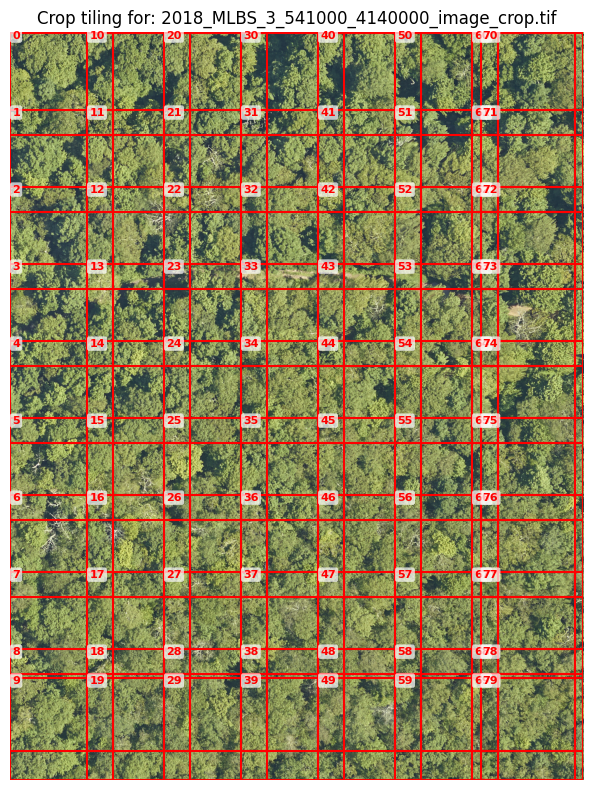

In [9]:
# Assuming you have a full .tif image path like:
full_image_path = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB/2018_MLBS_3_541000_4140000_image_crop.tif"

visualize_all_crop_tiles(full_image_path)


<div style="background-color:#fffbea; border-left:6px solid #ecc94b; padding:1.2em; font-family:'Segoe UI', sans-serif;">
  <p style="font-size:1.7em; color:#744210;">
    📘 <strong>Note:</strong> <span style="color:#2b6cb0;">This notebook is focused exclusively on <em>Exploratory Data Analysis (EDA)</em>.</span><br><br>
    🛠️ <span style="color:#2f855a;">Training methodologies, model configurations, and evaluation metrics will be detailed separately in a dedicated <strong>Modeling & Performance Notebook</strong>.</span>
  </p>
</div>
